## Description:
Splits isocontours into low- and high-curvature groups for model verification.


In [1]:
from __future__ import annotations
from pathlib import Path
import os
os.chdir("../../..")
import yaml
import numpy as np
import pandas as pd
from functools import lru_cache
from sklearn.linear_model import HuberRegressor, LinearRegression
from FLAME.io_fronts import Case, load_fronts, front_path


### Read config file and define helper functions


Load configuration values and plotting style settings.


In [2]:
PROJECT_ROOT = Path.cwd().resolve()
CONFIG_PATH = PROJECT_ROOT / "applications" / "case_studies/Model_verification" / "Model_verification.yaml"
GLOBAL_PLOT_STYLE_PATH = PROJECT_ROOT / "applications" / "case_studies" / "plot_style.yaml"
PLOT_STYLE_CFG = yaml.safe_load(GLOBAL_PLOT_STYLE_PATH.read_text(encoding="utf-8")) if GLOBAL_PLOT_STYLE_PATH.exists() else {}
LOCAL_CFG = yaml.safe_load(CONFIG_PATH.read_text(encoding="utf-8"))
CFG = dict(PLOT_STYLE_CFG)
CFG.update(LOCAL_CFG)

DATA_BASE_DIR = PROJECT_ROOT / Path(CFG["BASE_DIR"])
PHI = float(CFG["PHI"])
LAT_SIZE = str(CFG["LAT_SIZE"])
TIME_STEPS = list(CFG["TIME_STEPS"])

PROGRESS_LEVELS = list(CFG["PROGRESS_LEVELS"])
POST = bool(CFG["POST"])
MULTIPLE_RUNS = bool(CFG["MULTIPLE_RUNS"])
N_RUN = int(CFG["N_RUN"])

CURVATURE_COLUMN = str(CFG["CURVATURE_COLUMN"])
CURVATURE_LOW = float(CFG["CURVATURE_LOW"])
CURVATURE_HIGH = float(CFG["CURVATURE_HIGH"])

T_REF = float(CFG.get("T_REF", 300.0))
TEMPERATURE_NONDIM = bool(CFG.get("TEMPERATURE_NONDIM", True))
C_CONSTANT = float(CFG.get("C_CONSTANT", 0.0))
REMOVE_OUTLIERS = bool(CFG.get("REMOVE_OUTLIERS", True))
OUTLIER_IQR_SCALE = float(CFG.get("OUTLIER_IQR_SCALE", 1.5))



SAVE_SPLITS = bool(CFG["SAVE_SPLITS"])
REPORT_BASE_DIR = PROJECT_ROOT / Path(CFG["OUT_BASE_DIR"])

PHI_TAG = f"phi_{PHI:g}"
LAT_TAG = f"h400x{LAT_SIZE}_ref"


def time_dir(time_step: int) -> Path:
    return REPORT_BASE_DIR / PHI_TAG / LAT_TAG / f"t_{time_step}"


def case_out_dir(time_step: int, c_val: float | None = None, *parts: str) -> Path:
    out = time_dir(time_step)
    if c_val is not None and len(PROGRESS_LEVELS) > 1:
        out = out / f"T_{float(c_val):g}"
    for part in parts:
        out = out / part
    return out
LOW_FNAME_FMT = "curvature_le_{low:g}.csv"
HIGH_FNAME_FMT = "curvature_ge_{high:g}.csv"

if CURVATURE_LOW >= CURVATURE_HIGH:
    raise ValueError("CURVATURE_LOW must be < CURVATURE_HIGH")

# ============================================================
# PLOT STYLE (template-based)
# ============================================================
import matplotlib.pyplot as plt

PLOT_FONT_FAMILY = str(CFG.get("PLOT_FONT_FAMILY", "Courier New"))
PLOT_FONT_SIZE = int(CFG.get("PLOT_FONT_SIZE", 20))
FIG_DPI = int(CFG.get("FIG_DPI", 250))
FIG_SIZE_RAW = CFG.get("FIG_SIZE", (6.8, 6.2))
if isinstance(FIG_SIZE_RAW, (list, tuple)) and len(FIG_SIZE_RAW) == 2:
    FIG_SIZE = (float(FIG_SIZE_RAW[0]), float(FIG_SIZE_RAW[1]))
else:
    FIG_SIZE = (6.8, 6.2)

PLOT_USE_TEX = bool(CFG.get("PLOT_USE_TEX", False))
PLOT_TEX_PREAMBLE_RAW = CFG.get("PLOT_TEX_PREAMBLE", "")
if isinstance(PLOT_TEX_PREAMBLE_RAW, (list, tuple)):
    PLOT_TEX_PREAMBLE = "\n".join(str(item) for item in PLOT_TEX_PREAMBLE_RAW if item)
else:
    PLOT_TEX_PREAMBLE = str(PLOT_TEX_PREAMBLE_RAW) if PLOT_TEX_PREAMBLE_RAW is not None else ""

def apply_plot_style() -> None:
    params = {
        "font.family": PLOT_FONT_FAMILY,
        "font.size": PLOT_FONT_SIZE,
        "axes.titlesize": PLOT_FONT_SIZE,
        "axes.labelsize": PLOT_FONT_SIZE,
        "xtick.labelsize": PLOT_FONT_SIZE,
        "ytick.labelsize": PLOT_FONT_SIZE,
        "legend.fontsize": PLOT_FONT_SIZE,
        "figure.titlesize": PLOT_FONT_SIZE,
        "axes.linewidth": 1.2,
        "text.usetex": PLOT_USE_TEX,
        "figure.subplot.left": 0.14,
        "figure.subplot.right": 0.86,
        "figure.subplot.bottom": 0.14,
        "figure.subplot.top": 0.96,
    }
    if PLOT_TEX_PREAMBLE:
        params["text.latex.preamble"] = PLOT_TEX_PREAMBLE
    plt.rcParams.update(params)

apply_plot_style()

COLOR_DATA = str(CFG.get("COLOR_DATA", "#77b5b6"))
COLOR_DATA_EDGE = str(CFG.get("COLOR_DATA_EDGE", "#378d94"))
COLOR_PRED = str(CFG.get("COLOR_PRED", "#9671bd"))
COLOR_PRED_EDGE = str(CFG.get("COLOR_PRED_EDGE", "#6a408d"))
COLOR_NEUTRAL = str(CFG.get("COLOR_NEUTRAL", "#7e7e7e"))
COLOR_LINE = str(CFG.get("COLOR_LINE", "#8a8a8a"))
COLORMAP = str(CFG.get("COLORMAP", "brg"))
SCATTER_LINEWIDTH = float(CFG.get("SCATTER_LINEWIDTH", 0.5))
SD_PLOT_PERCENTILE_LOWER = float(CFG.get("SD_PLOT_PERCENTILE_LOWER", 1.0))
SD_PLOT_PERCENTILE_UPPER = float(CFG.get("SD_PLOT_PERCENTILE_UPPER", 99.0))

LABEL_CURV = r"$\tilde{\kappa}$"
LABEL_STRETCH = r"$\tilde{\mathbb{K}}$"
LABEL_SD = r"$\tilde{S}_d^*$"


def apply_plotly_style(fig) -> None:
    fig.update_layout(
            showlegend=False,
        template="plotly_white",
        font=dict(family=PLOT_FONT_FAMILY, size=PLOT_FONT_SIZE),
        legend=dict(font=dict(size=PLOT_FONT_SIZE - 2), title_text=None),
        margin=dict(l=10, r=10, t=10, b=10),
    )
    fig.update_layout(
            showlegend=False,
        scene=dict(
            xaxis=dict(
                showline=True,
                linecolor=COLOR_LINE,
                linewidth=1,
                ticks="outside",
                showgrid=True,
                gridcolor="rgba(0, 0, 0, 0.15)",
                zeroline=False,
                title_font=dict(size=PLOT_FONT_SIZE),
                tickfont=dict(size=PLOT_FONT_SIZE),
            ),
            yaxis=dict(
                showline=True,
                linecolor=COLOR_LINE,
                linewidth=1,
                ticks="outside",
                showgrid=True,
                gridcolor="rgba(0, 0, 0, 0.15)",
                zeroline=False,
                title_font=dict(size=PLOT_FONT_SIZE),
                tickfont=dict(size=PLOT_FONT_SIZE),
            ),
            zaxis=dict(
                showline=True,
                linecolor=COLOR_LINE,
                linewidth=1,
                ticks="outside",
                showgrid=True,
                gridcolor="rgba(0, 0, 0, 0.15)",
                zeroline=False,
                title_font=dict(size=PLOT_FONT_SIZE),
                tickfont=dict(size=PLOT_FONT_SIZE),
            ),
        )
    )




def style_axes(ax, *, equal: bool = False) -> None:
    ax.set_axisbelow(True)
    ax.minorticks_on()
    ax.grid(True, which="major", linestyle="-", linewidth=0.75, alpha=0.25)
    ax.grid(True, which="minor", linestyle="-", linewidth=0.25, alpha=0.15)
    ax.tick_params(axis="both", which="both", direction="in", top=True, right=True)
    ax.tick_params(axis="both", which="major", length=6, width=1.0)
    ax.tick_params(axis="both", which="minor", length=3, width=0.8)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
    if equal:
        ax.set_aspect("equal", adjustable="box")

def _ordered_percentiles(low: float, high: float) -> tuple[float, float]:
    low = float(np.clip(low, 0.0, 100.0))
    high = float(np.clip(high, 0.0, 100.0))
    return (low, high) if low <= high else (high, low)

def sd_percentile_bounds(values, low_pct: float | None = None, high_pct: float | None = None) -> tuple[float, float] | None:
    arr = pd.to_numeric(pd.Series(values), errors="coerce").to_numpy(dtype=float)
    arr = arr[np.isfinite(arr)]
    if arr.size == 0:
        return None
    if low_pct is None:
        low_pct = SD_PLOT_PERCENTILE_LOWER
    if high_pct is None:
        high_pct = SD_PLOT_PERCENTILE_UPPER
    lp, hp = _ordered_percentiles(low_pct, high_pct)
    lo, hi = np.percentile(arr, [lp, hp])
    if not (np.isfinite(lo) and np.isfinite(hi)):
        return None
    if lo == hi:
        span = 1.0 if lo == 0 else abs(lo) * 0.05
        lo -= span
        hi += span
    return float(lo), float(hi)

def sd_percentile_mask(values, low_pct: float | None = None, high_pct: float | None = None):
    arr = pd.to_numeric(pd.Series(values), errors="coerce").to_numpy(dtype=float)
    bounds = sd_percentile_bounds(arr, low_pct, high_pct)
    if bounds is None:
        return np.zeros(arr.size, dtype=bool), None
    lo, hi = bounds
    mask = np.isfinite(arr) & (arr >= lo) & (arr <= hi)
    return mask, bounds

def sd_minmax_bounds(*values) -> tuple[float, float] | None:
    finite_arrays = []
    for values_i in values:
        arr = pd.to_numeric(pd.Series(values_i), errors="coerce").to_numpy(dtype=float)
        arr = arr[np.isfinite(arr)]
        if arr.size > 0:
            finite_arrays.append(arr)
    if not finite_arrays:
        return None
    lo = float(min(np.min(arr) for arr in finite_arrays))
    hi = float(max(np.max(arr) for arr in finite_arrays))
    if lo == hi:
        span = 1.0 if lo == 0 else abs(lo) * 0.05
        lo -= span
        hi += span
    return lo, hi

def sd_joint_percentile_mask(*values, low_pct: float | None = None, high_pct: float | None = None):
    if not values:
        return np.array([], dtype=bool), None
    arrays = []
    n = None
    for values_i in values:
        arr = pd.to_numeric(pd.Series(values_i), errors="coerce").to_numpy(dtype=float)
        if n is None:
            n = arr.size
        elif arr.size != n:
            raise ValueError("All arrays must have equal length for joint percentile masking.")
        arrays.append(arr)
    mask = np.ones(int(n), dtype=bool)
    for arr in arrays:
        bounds = sd_percentile_bounds(arr, low_pct, high_pct)
        if bounds is None:
            return np.zeros(int(n), dtype=bool), None
        lo, hi = bounds
        mask &= np.isfinite(arr) & (arr >= lo) & (arr <= hi)
    if not np.any(mask):
        return mask, None
    bounds = sd_minmax_bounds(*(arr[mask] for arr in arrays))
    return mask, bounds

def filter_df_by_sd_percentile(df: pd.DataFrame, sd_col: str):
    if sd_col not in df.columns:
        return df.copy(), None
    mask, bounds = sd_percentile_mask(df[sd_col].to_numpy())
    if bounds is None:
        return df.iloc[0:0].copy(), None
    return df.loc[df.index[mask]].copy(), bounds

def apply_sd_ylim(ax) -> None:
    y_values = []
    for coll in ax.collections:
        offsets = coll.get_offsets()
        if offsets is None:
            continue
        offsets = np.asarray(offsets)
        if offsets.ndim == 2 and offsets.shape[1] >= 2 and offsets.size > 0:
            y_values.append(offsets[:, 1])
    for line in ax.lines:
        y_line = np.asarray(line.get_ydata(), dtype=float)
        if y_line.size > 0:
            y_values.append(y_line)
    if not y_values:
        return
    bounds = sd_minmax_bounds(*y_values)
    if bounds is not None:
        ax.set_ylim(*bounds)

def apply_sd_ylim_positive(ax) -> None:
    apply_sd_ylim(ax)

def apply_sd_ylim_negative(ax) -> None:
    apply_sd_ylim(ax)

def save_multi_fig(fig, base: Path, suffix: str) -> None:
    out = base.with_name(f"{base.name}_{suffix}")
    fig.savefig(out.with_suffix(".png"), dpi=FIG_DPI)
    fig.savefig(out.with_suffix(".pdf"))
    fig.savefig(out.with_suffix(".svg"))

# ============================================================
# HELPERS
# ============================================================
def make_case(time_step: int) -> Case:
    base_kwargs = dict(
        base_dir=DATA_BASE_DIR,
        phi=PHI,
        lat_size=LAT_SIZE,
        time_step=time_step,
        post=POST,
    )
    try:
        return Case(
            **base_kwargs,
            multiple_runs=MULTIPLE_RUNS,
            n_run=N_RUN
        )
    except TypeError:
        return Case(**base_kwargs)

def make_out_dir(time_step: int, c_val: float) -> Path:
    return case_out_dir(time_step, c_val)



def _parse_ref_filename(path: Path) -> dict[str, float]:
    name = path.stem
    parts = name.split("_")
    try:
        phi_val = float(parts[2])
        t_u = float(parts[4].rstrip("K"))
        p_atm = float(parts[6].rstrip("atm"))
    except (IndexError, ValueError):
        return {}
    return {"phi": phi_val, "T_u": t_u, "P_atm": p_atm}

def _pick_reference_csv(phi_val: float, t_ref: float | None) -> Path:
    ref_dir = PROJECT_ROOT / "data" / "Reference quantities"
    pattern = f"ref_phi_{phi_val:.2f}_Tu_*_P_*atm.csv"
    matches = sorted(ref_dir.glob(pattern))
    if not matches:
        raise FileNotFoundError(
            f"No reference quantities CSV found in {ref_dir} for phi={phi_val:.2f}"
        )
    if t_ref is None:
        return matches[0]
    scored = []
    for match in matches:
        meta = _parse_ref_filename(match)
        if not meta:
            scored.append((float("inf"), match))
            continue
        scored.append((abs(float(meta.get("T_u", t_ref)) - t_ref), match))
    scored.sort(key=lambda item: item[0])
    return scored[0][1]

def _load_reference_csv(phi_val: float, t_ref: float | None) -> dict[str, float]:
    ref_path = _pick_reference_csv(phi_val, t_ref)
    ref_df = pd.read_csv(ref_path)
    if ref_df.empty:
        raise ValueError(f"Reference quantities CSV is empty: {ref_path}")
    return ref_df.iloc[0].to_dict()

@lru_cache(maxsize=64)
def load_reference_quantities(case: Case, iso: float) -> dict[str, float]:
    fp = front_path(case, float(iso))
    ref = None
    try:
        with pd.HDFStore(fp, mode="r") as store:
            if "/data/reference_quantities" in store.keys():
                ref = store.get("/data/reference_quantities")
            elif "/reference_quantities" in store.keys():
                ref = store.get("/reference_quantities")
            elif "/data" in store.keys():
                attrs = store.get_storer("/data").attrs
                if hasattr(attrs, "reference_quantities"):
                    ref = attrs.reference_quantities
    except (FileNotFoundError, OSError, KeyError, ValueError):
        ref = None

    if ref is not None:
        if isinstance(ref, pd.DataFrame):
            ref_dict = ref.iloc[0].to_dict()
        elif isinstance(ref, pd.Series):
            ref_dict = ref.to_dict()
        else:
            ref_dict = dict(ref)
    else:
        ref_dict = _load_reference_csv(PHI, T_REF)

    if "L_ref" in ref_dict:
        l_ref = ref_dict["L_ref"]
    elif "l_T" in ref_dict:
        l_ref = ref_dict["l_T"]
    elif "l_f" in ref_dict:
        l_ref = ref_dict["l_f"]
    else:
        raise KeyError("L_ref not found in reference quantities")

    return {
        "S_L": float(ref_dict["S_L"]),
        "L_ref": float(l_ref),
    }
def require_columns(df: pd.DataFrame, cols: list[str], context: str = "") -> None:
    missing = [c for c in cols if c not in df.columns]
    if missing:
        raise ValueError(f"{context} Missing columns: {missing}")

def clean_valid_rows(df: pd.DataFrame, cols_needed: list[str]) -> pd.DataFrame:
    valid = df[cols_needed].replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")
    return df.loc[valid.index].copy()

THERMAL_DIFF_SCALE = 1e-04

def scale_thermal_diffusivity(df: pd.DataFrame) -> pd.DataFrame:
    col = globals().get("THERMAL_DIFF_COLUMN", "thermal_diffusivity")
    if col not in df.columns:
        return df
    series = df[col]
    max_val = float(np.nanmax(series.to_numpy()))
    # Skip scaling if values already look like m^2/s.
    if max_val <= 1e-3:
        return df
    df = df.copy()
    df[col] = df[col] * THERMAL_DIFF_SCALE
    return df

def remove_outliers_iqr(
    df: pd.DataFrame,
    cols: list[str],
    iqr_scale: float = 1.5,
) -> pd.DataFrame:
    if df.empty:
        return df.copy()
    mask = pd.Series(True, index=df.index)
    for col in cols:
        q1 = float(df[col].quantile(0.25))
        q3 = float(df[col].quantile(0.75))
        iqr = q3 - q1
        if not np.isfinite(iqr) or iqr == 0.0:
            continue
        lower = q1 - iqr_scale * iqr
        upper = q3 + iqr_scale * iqr
        mask &= df[col].between(lower, upper)
    return df.loc[mask].copy()

def apply_outlier_filter(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    if not REMOVE_OUTLIERS:
        return df.copy()
    return remove_outliers_iqr(df, cols, iqr_scale=OUTLIER_IQR_SCALE)

def split_by_curvature(df: pd.DataFrame, col: str, low: float, high: float) -> tuple[pd.DataFrame, pd.DataFrame]:
    low_df = df[df[col] <= low].copy()
    high_df = df[df[col] >= high].copy()
    return low_df, high_df

def save_split(df: pd.DataFrame, savepath: Path | None, label: str) -> None:
    if savepath is None:
        return
    if df.empty:
        print(f"  {label}: skipped save (n=0)")
        return
    df.to_csv(savepath, index=False)



### Run


Split isocontours by curvature and save subsets.


In [3]:
for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        require_columns(front, [CURVATURE_COLUMN], context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, [CURVATURE_COLUMN])
        dfv = scale_thermal_diffusivity(dfv)

        low_df, high_df = split_by_curvature(dfv, CURVATURE_COLUMN, CURVATURE_LOW, CURVATURE_HIGH)
        print(
            f"t={t}, T={float(c_val):.2f}: n_total={len(dfv)}, n_low={len(low_df)}, n_high={len(high_df)}"
        )

        if SAVE_SPLITS:
            out_dir = make_out_dir(t, float(c_val))
            out_dir.mkdir(parents=True, exist_ok=True)
            low_path = out_dir / LOW_FNAME_FMT.format(low=CURVATURE_LOW)
            high_path = out_dir / HIGH_FNAME_FMT.format(high=CURVATURE_HIGH)
            save_split(low_df, low_path, "low")
            save_split(high_df, high_path, "high")


t=200, T=0.60: n_total=6503, n_low=1122, n_high=3014


Isocontour scatter plots before regression.


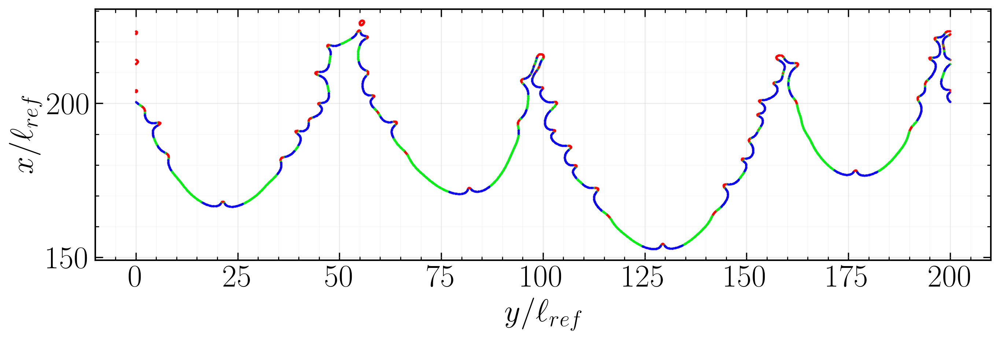

In [ ]:
# Isocontour scatter plot (x vs y) before regressions
import matplotlib.pyplot as plt

SCATTER_S_ISO = 3
ALPHA_ISO = 0.6
RASTERIZE_ISO = False
SAVE_ISO_SCATTER = True
ISO_SCATTER_DIR = "isocontour_scatter"
ISO_FIG_SIZE = (10.8, 3.6)

###
#Hardcoded for presentation
NEG_CURV_COLOR = "#FF0000"
COLOR_DATA = 	"#00FF00"
COLOR_PRED = "#0000FF"
###

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()
        require_columns(front, ["x", "y", CURVATURE_COLUMN], context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, ["x", "y", CURVATURE_COLUMN])

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW]
        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH]
        mid_df = dfv[(dfv[CURVATURE_COLUMN] > CURVATURE_LOW) & (dfv[CURVATURE_COLUMN] < CURVATURE_HIGH)]

        fig, ax = plt.subplots(figsize=ISO_FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)
        ax.scatter(
            neg_df["y"],
            neg_df["x"],
            s=SCATTER_S_ISO,
            alpha=ALPHA_ISO,
            color=NEG_CURV_COLOR,
            edgecolors=NEG_CURV_COLOR,
            linewidths=SCATTER_LINEWIDTH,
            zorder=2,
            rasterized=RASTERIZE_ISO,
        )
        ax.scatter(
            mid_df["y"],
            mid_df["x"],
            s=SCATTER_S_ISO,
            alpha=ALPHA_ISO,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
            rasterized=RASTERIZE_ISO,
        )
        ax.scatter(
            pos_df["y"],
            pos_df["x"],
            s=SCATTER_S_ISO,
            alpha=ALPHA_ISO,
            color=COLOR_PRED,
            edgecolors=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            zorder=4,
            rasterized=RASTERIZE_ISO,
        )
        ax.set_xlabel(r'$y / \ell_{ref}$')
        ax.set_ylabel(r'$x / \ell_{ref}$')
        style_axes(ax)

        savepath = None
        if SAVE_ISO_SCATTER:
            out_dir = case_out_dir(t, c_val, ISO_SCATTER_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            savepath = out_dir / "isocontour_scatter"
            fig.savefig(savepath.with_suffix(".png"), dpi=FIG_DPI, bbox_inches="tight")
            fig.savefig(savepath.with_suffix(".pdf"), bbox_inches="tight")
            fig.savefig(savepath.with_suffix(".svg"), bbox_inches="tight")

        plt.show()
        plt.close(fig)


All-data scatter: Sd vs curvature.


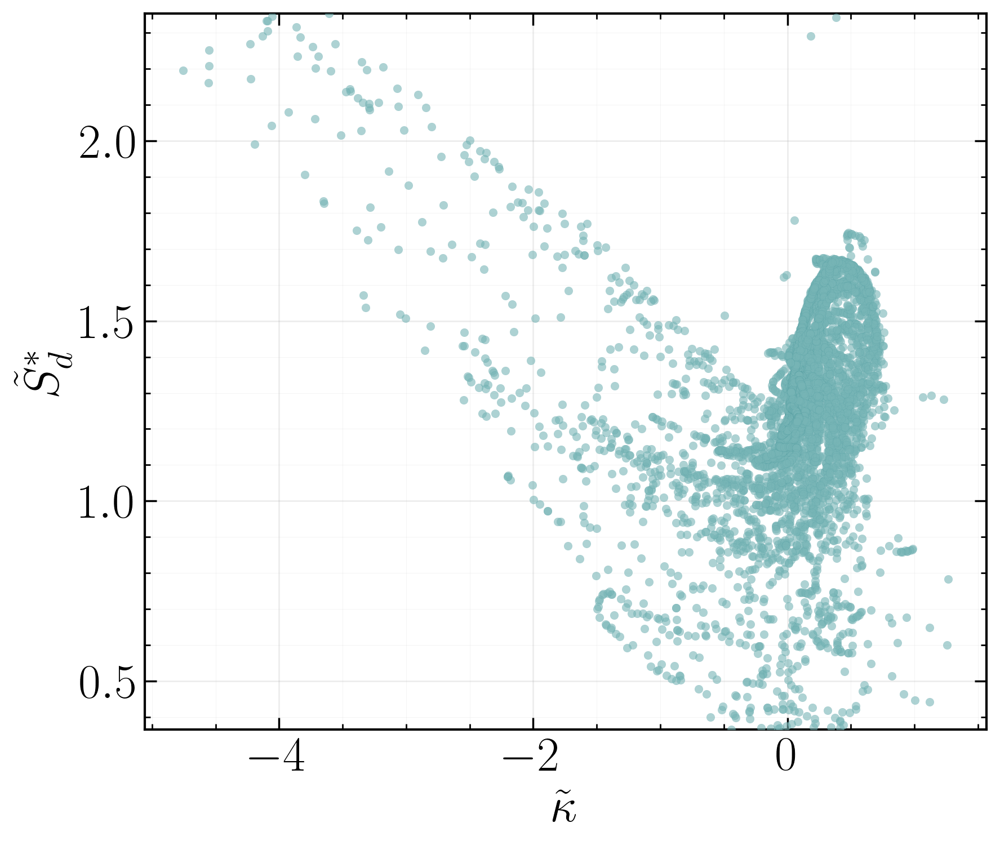

In [5]:
# Sd vs curvature using all data
import matplotlib.pyplot as plt

TARGET_COLUMN = "DW_FDS"
STRETCH_COLUMN = "stretch_rate"

SAVE_ALL_DATA_PLOTS = True
ALL_DATA_OUT_DIR = "all_data_plots"
ALL_SCATTER_S = 18
ALL_ALPHA = 0.6

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)
        dfv, _ = filter_df_by_sd_percentile(dfv, TARGET_COLUMN)
        if dfv.empty:
            print(f"t={t}, T={float(c_val):.2f}: skipped (no points in Sd percentile range)")
            continue

        savepath = None
        if SAVE_ALL_DATA_PLOTS:
            out_dir = case_out_dir(t, c_val, ALL_DATA_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            savepath = out_dir / "all_data"

        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            dfv[CURVATURE_COLUMN],
            dfv[TARGET_COLUMN],
            s=ALL_SCATTER_S,
            alpha=ALL_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
        )
        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        style_axes(ax)
        apply_sd_ylim(ax)
        if savepath is not None:
            save_multi_fig(fig, savepath, "sd_vs_curvature")
        plt.show()
        plt.close(fig)


All-data scatter: Sd vs stretch.


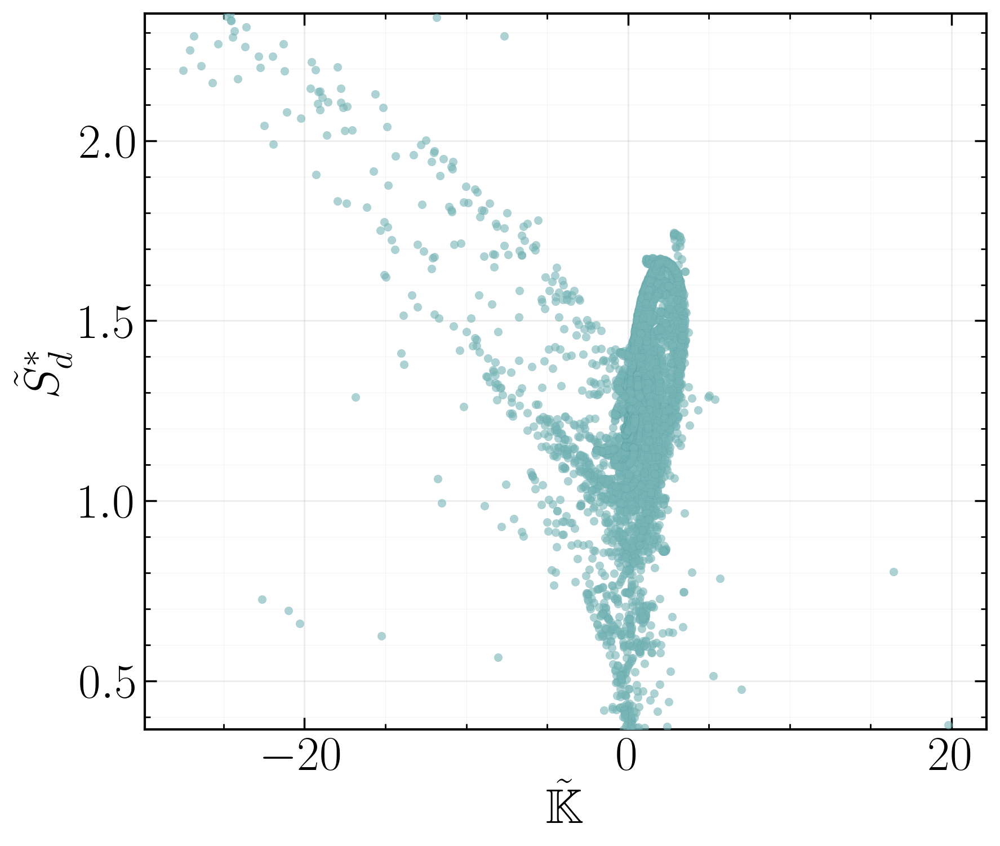

In [6]:
# Sd vs stretch using all data
import matplotlib.pyplot as plt

TARGET_COLUMN = "DW_FDS"
STRETCH_COLUMN = "stretch_rate"

SAVE_ALL_DATA_PLOTS = True
ALL_DATA_OUT_DIR = "all_data_plots"
ALL_SCATTER_S = 18
ALL_ALPHA = 0.6

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)
        dfv, _ = filter_df_by_sd_percentile(dfv, TARGET_COLUMN)
        if dfv.empty:
            print(f"t={t}, T={float(c_val):.2f}: skipped (no points in Sd percentile range)")
            continue

        savepath = None
        if SAVE_ALL_DATA_PLOTS:
            out_dir = case_out_dir(t, c_val, ALL_DATA_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            savepath = out_dir / "all_data"
        
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            dfv[STRETCH_COLUMN],
            dfv[TARGET_COLUMN],
            s=ALL_SCATTER_S,
            alpha=ALL_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
        )
        ax.set_xlabel(LABEL_STRETCH)
        ax.set_ylabel(LABEL_SD)
        style_axes(ax)
        apply_sd_ylim(ax)
        if savepath is not None:
            save_multi_fig(fig, savepath, "sd_vs_stretch")
        plt.show()
        plt.close(fig)


Joint fit for positive-curvature data (curvature + stretch).


In [7]:
# Fit Sd = 1 - L_curv * curvature - L_str * stretch_rate on positive-curvature group
TARGET_COLUMN = "DW_FDS"
STRETCH_COLUMN = "stretch_rate"

def fit_markstein_lengths(
    df: pd.DataFrame,
    curv_col: str,
    stretch_col: str,
    target_col: str,
) -> tuple[float, float, float, float]:
    X = df[[curv_col, stretch_col]].to_numpy()
    y_true = df[target_col].to_numpy()
    y_fit = 1.0 - y_true
    model = LinearRegression(fit_intercept=False)
    model.fit(X, y_fit)
    y_pred = 1.0 - model.predict(X)
    ss_res = float(((y_true - y_pred) ** 2).sum())
    ss_tot = float(((y_true - y_true.mean()) ** 2).sum())
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return float(model.coef_[0]), float(model.coef_[1]), r2, rmse

def fit_markstein_lengths_huber(
    df: pd.DataFrame,
    curv_col: str,
    stretch_col: str,
    target_col: str,
    delta: float | None = None,
    max_iter: int = 50,
    tol: float = 1e-6,
) -> tuple[float, float, float, float]:
    X = df[[curv_col, stretch_col]].to_numpy()
    y_true = df[target_col].to_numpy()
    y_fit = 1.0 - y_true

    epsilon = 1.35
    if delta is not None:
        ols = LinearRegression(fit_intercept=False)
        ols.fit(X, y_fit)
        r = y_fit - ols.predict(X)
        med = float(np.median(r))
        mad = float(np.median(np.abs(r - med)))
        scale = 1.4826 * mad
        if not np.isfinite(scale) or scale == 0.0:
            std = float(np.std(r))
            scale = std if std > 0.0 else 1.0
        epsilon = max(1.0001, float(delta) / scale)

    model = HuberRegressor(
        fit_intercept=False,
        epsilon=epsilon,
        max_iter=max_iter,
        tol=tol,
        alpha=0.0,
    )
    model.fit(X, y_fit)
    y_pred = 1.0 - model.predict(X)
    ss_res = float(((y_true - y_pred) ** 2).sum())
    ss_tot = float(((y_true - y_true.mean()) ** 2).sum())
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return float(model.coef_[0]), float(model.coef_[1]), r2, rmse

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(
            pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        )

        l_curv, l_str, r2, rmse = fit_markstein_lengths(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        print(
            f"t={t}, T={float(c_val):.2f}: Sd = 1 - {l_curv:.3e}*curvature - {l_str:.3e}*stretch_rate | R^2={r2:.3f}, RMSE={rmse:.3e}"
        )


t=200, T=0.60: Sd = 1 - 3.404e-01*curvature - -2.543e-01*stretch_rate | R^2=-0.357, RMSE=2.422e-01


Sequential fit for positive-curvature data (stretch then curvature).


In [8]:
# Positive-curvature sequential fit: first stretch, then curvature
def fit_markstein_lengths_sequential(
    df: pd.DataFrame,
    curv_col: str,
    stretch_col: str,
    target_col: str,
) -> tuple[float, float, float, float]:
    curv = df[curv_col].to_numpy()
    stretch = df[stretch_col].to_numpy()
    y_true = df[target_col].to_numpy()
    y_fit = 1.0 - y_true
    den_str = float(np.dot(stretch, stretch))
    if den_str <= 0.0:
        raise ValueError("Invalid fit: zero denominator for stretch regression")
    stretch_model = LinearRegression(fit_intercept=False)
    stretch_model.fit(stretch.reshape(-1, 1), y_fit)
    l_str = float(stretch_model.coef_[0])
    y_res = y_fit - stretch_model.predict(stretch.reshape(-1, 1))
    den_curv = float(np.dot(curv, curv))
    if den_curv <= 0.0:
        raise ValueError("Invalid fit: zero denominator for curvature regression")
    curv_model = LinearRegression(fit_intercept=False)
    curv_model.fit(curv.reshape(-1, 1), y_res)
    l_curv = float(curv_model.coef_[0])
    y_pred = 1.0 - (l_curv * curv + l_str * stretch)
    ss_res = float(((y_true - y_pred) ** 2).sum())
    ss_tot = float(((y_true - y_true.mean()) ** 2).sum())
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return l_curv, l_str, r2, rmse

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(
            pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        )

        l_curv, l_str, r2, rmse = fit_markstein_lengths_sequential(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        print(
            f"t={t}, T={float(c_val):.2f}: Sd = 1 - {l_curv:.3e}*curvature - {l_str:.3e}*stretch_rate | R^2={r2:.3f}, RMSE={rmse:.3e}"
        )


t=200, T=0.60: Sd = 1 - 1.488e-02*curvature - -1.860e-01*stretch_rate | R^2=-0.372, RMSE=2.436e-01


Robust (Huber) fit for positive-curvature data (curvature + stretch).


In [9]:
# Positive-curvature robust fit using Huber loss
for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(
            pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        )

        l_curv, l_str, r2, rmse = fit_markstein_lengths_huber(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        print(
            f"t={t}, T={float(c_val):.2f} (Huber): Sd = 1 - {l_curv:.3e}*curvature - {l_str:.3e}*stretch_rate | R^2={r2:.3f}, RMSE={rmse:.3e}"
        )


t=200, T=0.60 (Huber): Sd = 1 - 3.086e-01*curvature - -2.477e-01*stretch_rate | R^2=-0.357, RMSE=2.423e-01


Positive-curvature diagnostic plot functions.


In [10]:
# Fit diagnostics plot functions for the positive-curvature group
import matplotlib.pyplot as plt

SAVE_FIT_PLOTS = True
FIT_OUT_DIR = "fit_plots"
DIAG_SCATTER_S = 18
DIAG_ALPHA = 0.6
LINE_WIDTH = 2.2
LEGEND_KWARGS = dict(
    markerscale=2.0,
    frameon=False,
    fontsize=PLOT_FONT_SIZE - 2,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.10),
    ncol=2,
    borderaxespad=0.0,
)


def plot_fit_diagnostics(
    df: pd.DataFrame,
    l_curv: float,
    l_str: float,
    curv_col: str,
    stretch_col: str,
    target_col: str,
    plot_kind: str,
    xlim: tuple[float, float] | None = None,
    ylim: tuple[float, float] | None = None,
    savepath: Path | None = None,
) -> None:
    X = df[[curv_col, stretch_col]].to_numpy()
    y = df[target_col].to_numpy()
    y_pred = 1.0 - (X @ np.array([l_curv, l_str]))
    mask, sd_bounds = sd_joint_percentile_mask(y, y_pred)
    if sd_bounds is None:
        print("plot_fit_diagnostics: skipped (no points in joint Sd percentile range)")
        return
    df_plot = df.loc[df.index[mask]].copy()
    y_plot = y[mask]
    y_pred_plot = y_pred[mask]

    if plot_kind == "pred_vs_true":
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            y_plot,
            y_pred_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Data",
        )
        lim_min = float(min(y_plot.min(), y_pred_plot.min()))
        lim_max = float(max(y_plot.max(), y_pred_plot.max()))
        ax.plot(
            [lim_min, lim_max],
            [lim_min, lim_max],
            linestyle="--",
            color=COLOR_LINE,
            linewidth=LINE_WIDTH,
            label="1:1",
        )
        ax.set_xlabel(f"{LABEL_SD} (true)")
        ax.set_ylabel(f"{LABEL_SD} (pred)")
        style_axes(ax, equal=True)
        if savepath is not None:
            savepath.parent.mkdir(parents=True, exist_ok=True)
            save_multi_fig(fig, savepath, "pred_vs_true")
        plt.show()
        plt.close(fig)
    elif plot_kind == "sd_vs_curvature":
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            df_plot[curv_col],
            y_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Data",
        )
        ax.scatter(
            df_plot[curv_col],
            y_pred_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_PRED,
            edgecolors=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Prediction",
        )
        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        style_axes(ax)
        if xlim is not None:
            ax.set_xlim(xlim)
        ax.set_ylim(*sd_bounds)
        if savepath is not None:
            savepath.parent.mkdir(parents=True, exist_ok=True)
            save_multi_fig(fig, savepath, "sd_vs_curvature")
        plt.show()
        plt.close(fig)
    elif plot_kind == "sd_vs_stretch":
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            df_plot[stretch_col],
            y_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Data",
        )
        ax.scatter(
            df_plot[stretch_col],
            y_pred_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_PRED,
            edgecolors=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Prediction",
        )
        ax.set_xlabel(LABEL_STRETCH)
        ax.set_ylabel(LABEL_SD)
        style_axes(ax)
        if xlim is not None:
            ax.set_xlim(xlim)
        ax.set_ylim(*sd_bounds)
        if savepath is not None:
            savepath.parent.mkdir(parents=True, exist_ok=True)
            save_multi_fig(fig, savepath, "sd_vs_stretch")
        plt.show()
        plt.close(fig)
    else:
        raise ValueError(f"Unknown plot_kind: {plot_kind}")


Positive-curvature diagnostics: Sd vs curvature and Sd vs stretch.


In [11]:
# Precompute positive-curvature fits and shared axis limits for joint/sequential/huber
POS_FIT_CACHE = {}

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(
            pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        )

        l_curv, l_str, _, _ = fit_markstein_lengths(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        l_curv_seq, l_str_seq, _, _ = fit_markstein_lengths_sequential(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        l_curv_huber, l_str_huber, _, _ = fit_markstein_lengths_huber(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )

        X = pos_df[[CURVATURE_COLUMN, STRETCH_COLUMN]].to_numpy()
        y_true = pos_df[TARGET_COLUMN].to_numpy()

        y_pred_joint = 1.0 - (X @ np.array([l_curv, l_str]))
        y_pred_seq = 1.0 - (X @ np.array([l_curv_seq, l_str_seq]))
        y_pred_huber = 1.0 - (X @ np.array([l_curv_huber, l_str_huber]))

        sd_min = float(min(y_true.min(), y_pred_joint.min(), y_pred_seq.min(), y_pred_huber.min()))
        sd_max = float(max(y_true.max(), y_pred_joint.max(), y_pred_seq.max(), y_pred_huber.max()))
        curv_min = float(pos_df[CURVATURE_COLUMN].min())
        curv_max = float(pos_df[CURVATURE_COLUMN].max())
        stretch_min = float(pos_df[STRETCH_COLUMN].min())
        stretch_max = float(pos_df[STRETCH_COLUMN].max())

        POS_FIT_CACHE[(int(t), float(c_val))] = dict(
            df=pos_df,
            joint=(l_curv, l_str),
            sequential=(l_curv_seq, l_str_seq),
            huber=(l_curv_huber, l_str_huber),
            lims=dict(
                curv=(curv_min, curv_max),
                stretch=(stretch_min, stretch_max),
                sd=(sd_min, sd_max),
            ),
        )


def plot_pos_model(model_name: str) -> None:
    for key in sorted(POS_FIT_CACHE):
        t, c_val = key
        entry = POS_FIT_CACHE[key]
        pos_df = entry["df"]
        l_curv, l_str = entry[model_name]
        lims = entry["lims"]

        for plot_kind in ("sd_vs_curvature", "sd_vs_stretch"):
            savepath = None
            if SAVE_FIT_PLOTS:
                out_dir = case_out_dir(t, c_val, FIT_OUT_DIR, model_name)
                savepath = out_dir / f"{model_name}_fit_diagnostics"

            xlim = lims["curv"] if plot_kind == "sd_vs_curvature" else None
            ylim = lims["sd"]

            plot_fit_diagnostics(
                pos_df,
                l_curv=l_curv,
                l_str=l_str,
                curv_col=CURVATURE_COLUMN,
                stretch_col=STRETCH_COLUMN,
                target_col=TARGET_COLUMN,
                plot_kind=plot_kind,
                savepath=savepath,
                xlim=xlim,
                ylim=ylim,
            )


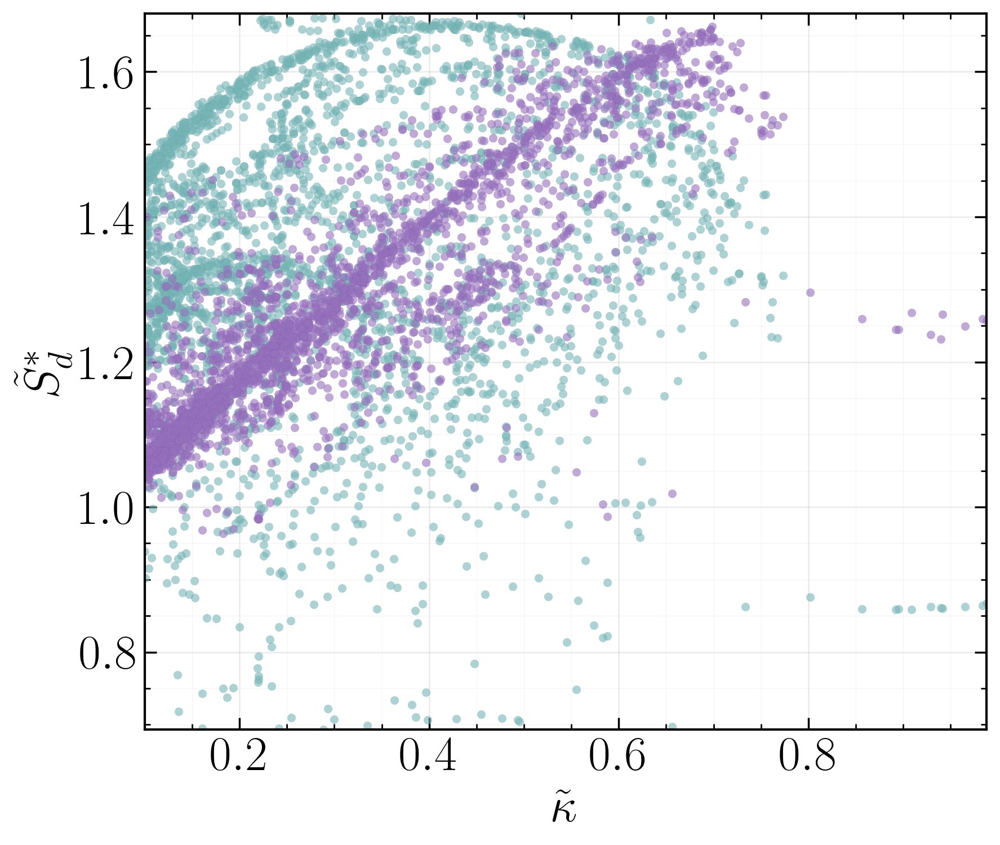

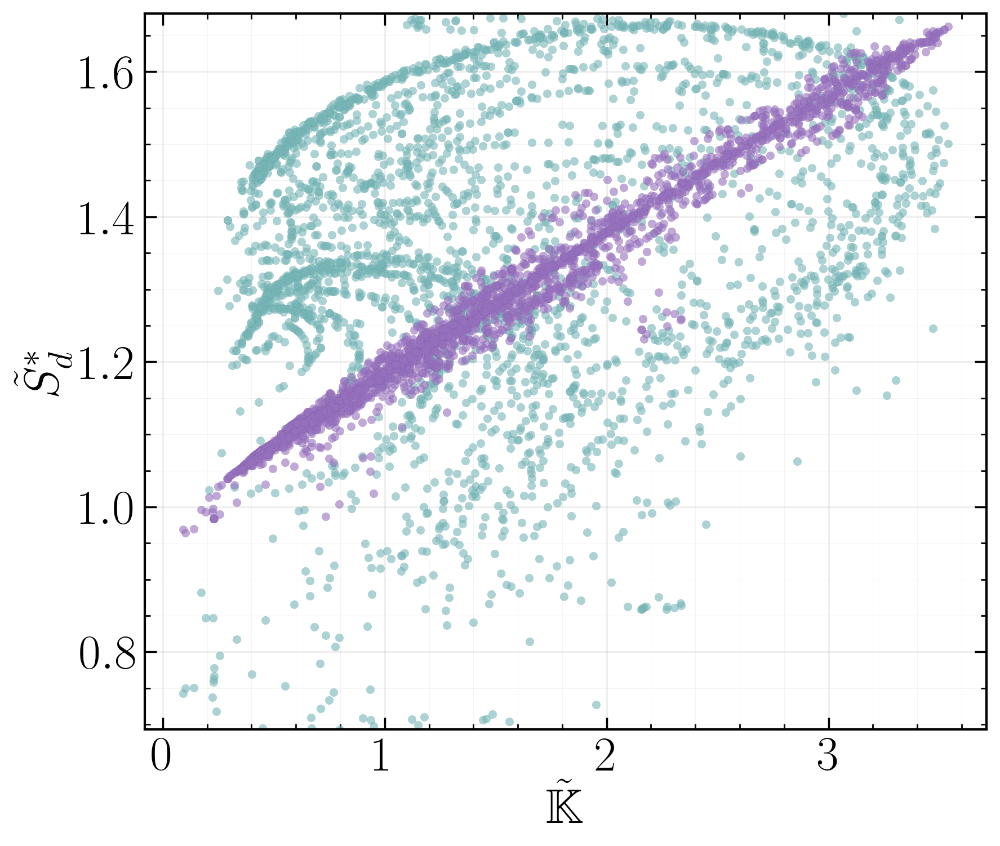

In [12]:
# Joint model plots (shared ranges)
plot_pos_model("joint")


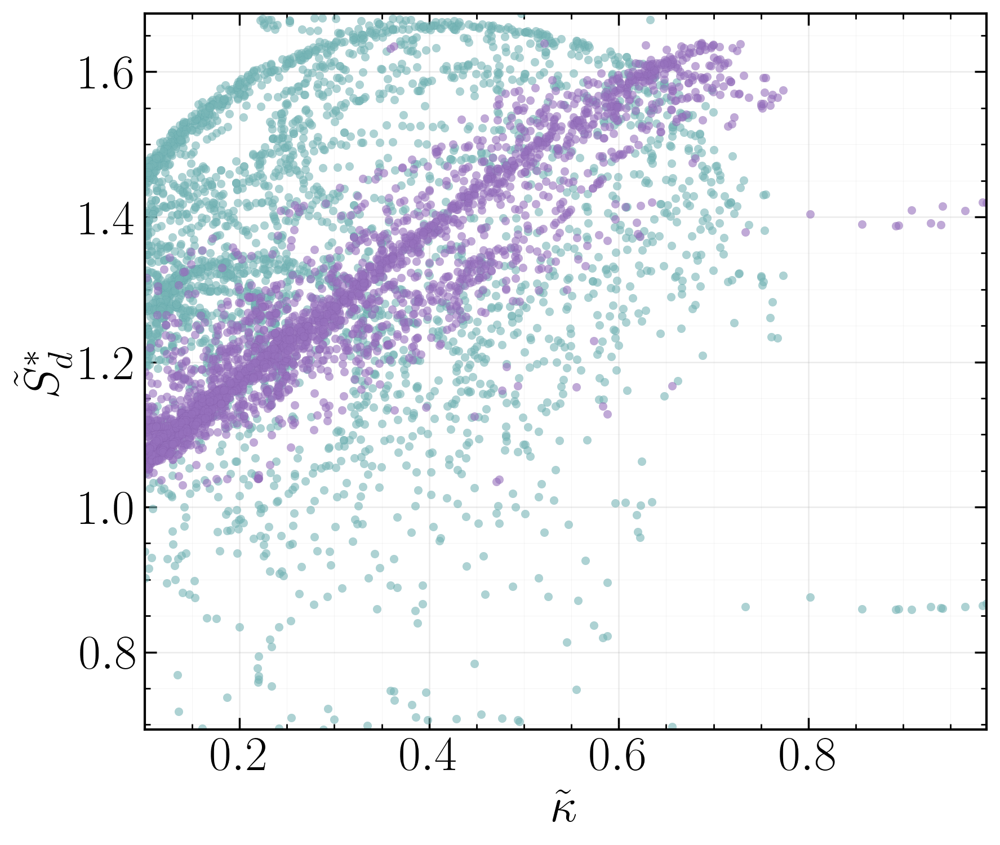

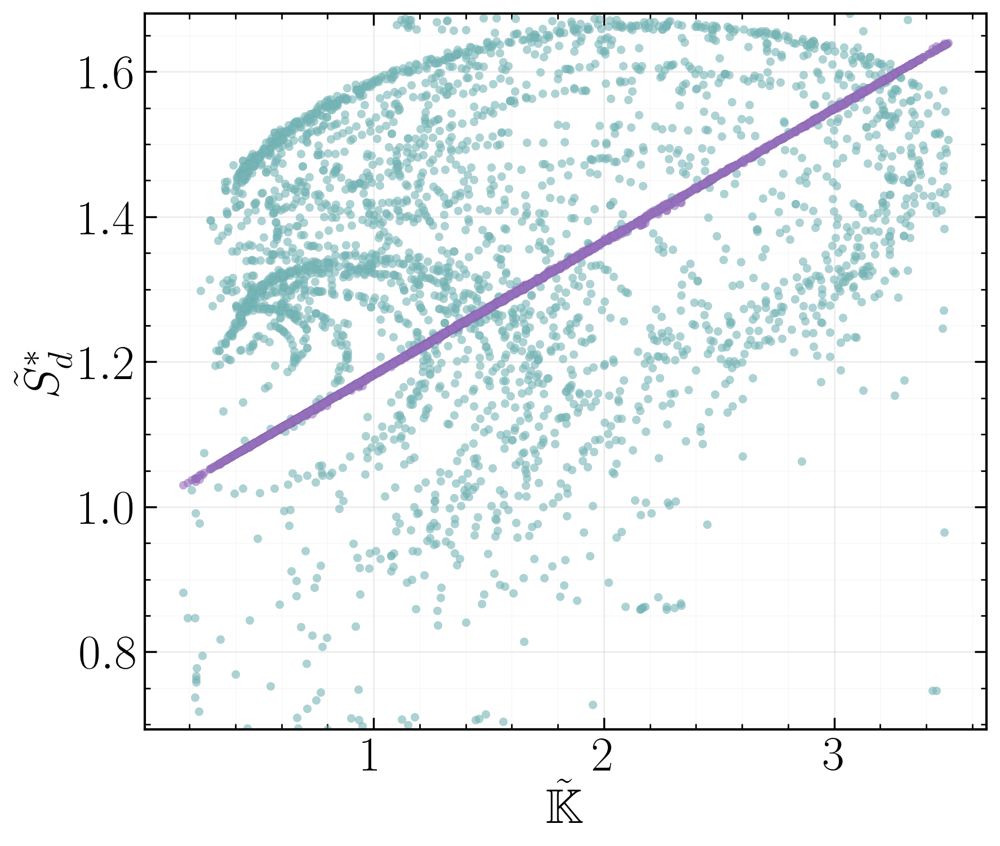

In [13]:
# Sequential model plots (shared ranges)
plot_pos_model("sequential")


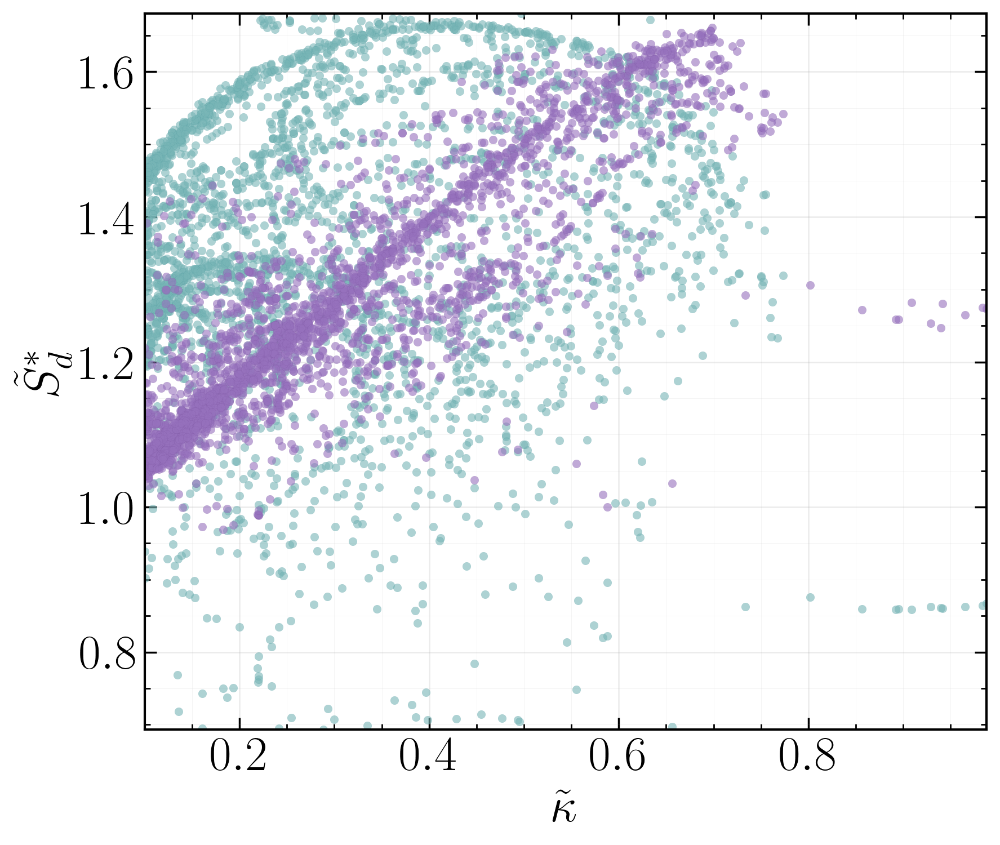

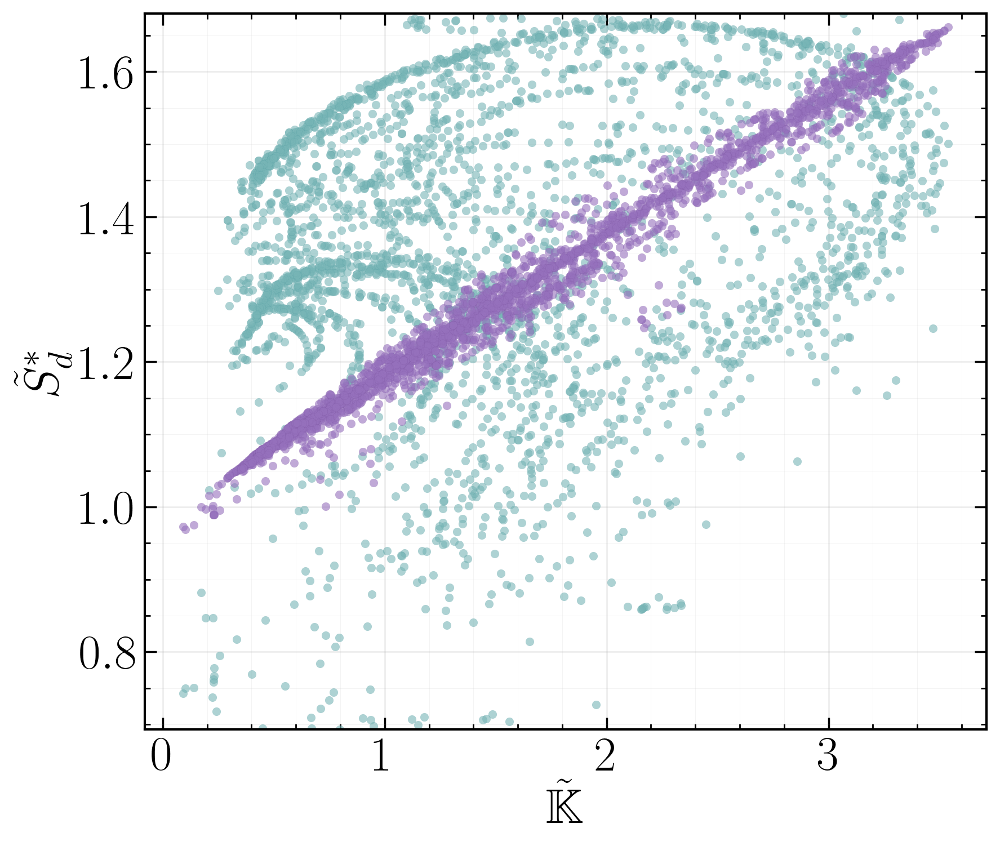

In [14]:
# Huber model plots (shared ranges)
plot_pos_model("huber")


Tabulated Markstein model: predicted vs true.


t=200, T=0.60 (progress=0.6025): Sd = 1 - 2.926e-01*curvature - -3.450e-01*stretch_rate


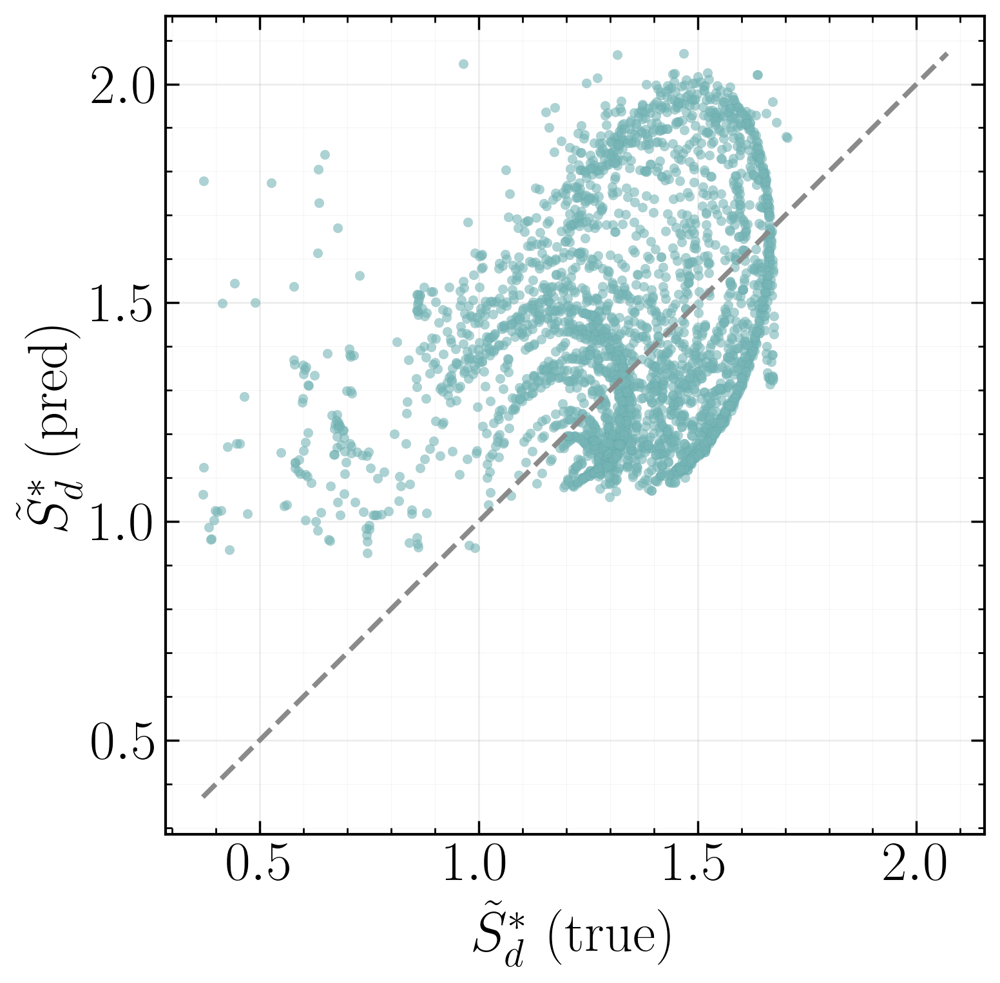

In [15]:
# Positive-curvature model using tabulated Markstein lengths (pred vs true)
import pandas as pd

MARKSTEIN_TABLE_DIR = PROJECT_ROOT / "data" / "Markstein lengths"
MARKSTEIN_TABLES = sorted(MARKSTEIN_TABLE_DIR.glob("markstein_phi_*_P_*atm_*_c_*_Tiso_*K.csv"))
if not MARKSTEIN_TABLES:
    # Backward compatibility with older exports.
    MARKSTEIN_TABLES = sorted(MARKSTEIN_TABLE_DIR.glob("markstein_phi_*.csv"))
if not MARKSTEIN_TABLES:
    raise FileNotFoundError(f"No Markstein tables found in {MARKSTEIN_TABLE_DIR}")

def _token_to_float(token: str) -> float:
    return float(token.replace("p", "."))

def _parse_markstein_filename(path: Path) -> dict:
    # Expected new format:
    # markstein_phi_{phi}_P_{P}atm_{iso_mode}_c_{c}_Tiso_{T}K.csv
    parts = path.stem.split("_")
    try:
        return {
            "phi": _token_to_float(parts[2]),
            "P_atm": _token_to_float(parts[4].replace("atm", "")),
            "iso_mode": parts[5],
            "c_iso": _token_to_float(parts[7]),
            "T_iso_K": _token_to_float(parts[9].replace("K", "")),
        }
    except (IndexError, ValueError):
        return {}

target_c = float(PROGRESS_LEVELS[0]) if PROGRESS_LEVELS else 0.5
phi_tol = 1.1e-2  # match files saved with two-decimal phi tag
scored = []
for p in MARKSTEIN_TABLES:
    meta = _parse_markstein_filename(p)
    if not meta:
        continue
    if abs(float(meta["phi"]) - PHI) <= phi_tol:
        score = abs(float(meta["c_iso"]) - target_c)
        scored.append((score, abs(float(meta["P_atm"]) - 1.0), p))

if scored:
    scored.sort(key=lambda x: (x[0], x[1], x[2].name))
    markstein_path = scored[0][2]
else:
    phi_token_new = f"phi_{PHI:.2f}".replace(".", "p")
    phi_token_old = f"phi_{PHI:.2f}"
    markstein_path = next(
        (p for p in MARKSTEIN_TABLES if (phi_token_new in p.name or phi_token_old in p.name)),
        MARKSTEIN_TABLES[0],
    )
    print(f"Markstein table for phi={PHI:.2f} not found exactly; using {markstein_path.name}")

markstein_df = pd.read_csv(markstein_path)
if {"M_curvature", "M_stretch"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "M_curvature", "M_stretch"
elif {"L_curv_nd", "L_stretch_nd"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "L_curv_nd", "L_stretch_nd"
elif {"L_cur", "L_str"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "L_cur", "L_str"
else:
    raise ValueError(
        "Markstein table must contain one of: "
        "(M_curvature, M_stretch), (L_curv_nd, L_stretch_nd), or (L_cur, L_str)."
    )
require_columns(markstein_df, ["progress", l_cur_col, l_str_col], context="Markstein table:")


def lookup_markstein_lengths(progress_value: float) -> tuple[float, float, float]:
    diffs = (markstein_df["progress"] - progress_value).abs()
    idx = int(diffs.idxmin())
    row = markstein_df.loc[idx]
    return float(row[l_cur_col]), float(row[l_str_col]), float(row["progress"])


for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        l_curv, l_str, c_match = lookup_markstein_lengths(float(c_val))
        print(
            f"t={t}, T={float(c_val):.2f} (progress={c_match:.4f}): Sd = 1 - {l_curv:.3e}*curvature - {l_str:.3e}*stretch_rate"
        )

        savepath = None
        if SAVE_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, FIT_OUT_DIR, "tabulated")
            savepath = out_dir / "tabulated_fit_diagnostics"

        plot_fit_diagnostics(
            pos_df,
            l_curv=l_curv,
            l_str=l_str,
            curv_col=CURVATURE_COLUMN,
            stretch_col=STRETCH_COLUMN,
            target_col=TARGET_COLUMN,
            plot_kind="pred_vs_true",
            savepath=savepath,
        )


Tabulated Markstein model: Sd vs curvature and stretch.


t=200, T=0.60 (progress=0.6025): Sd = 1 - 2.926e-01*curvature - -3.450e-01*stretch_rate


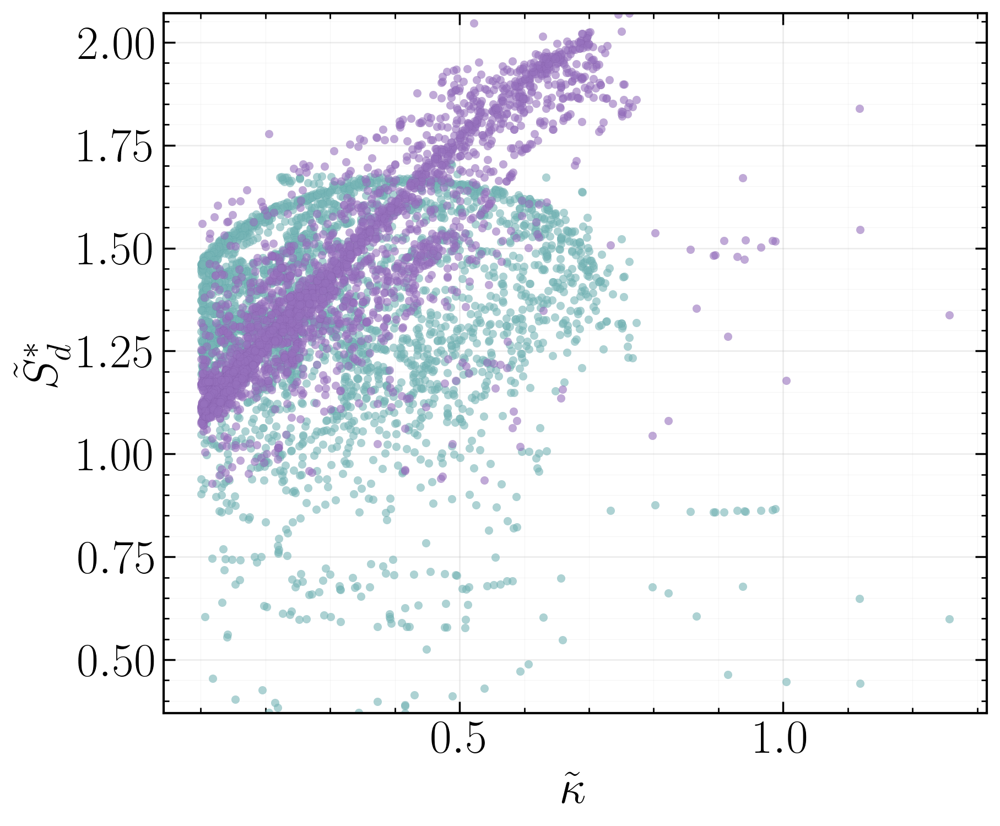

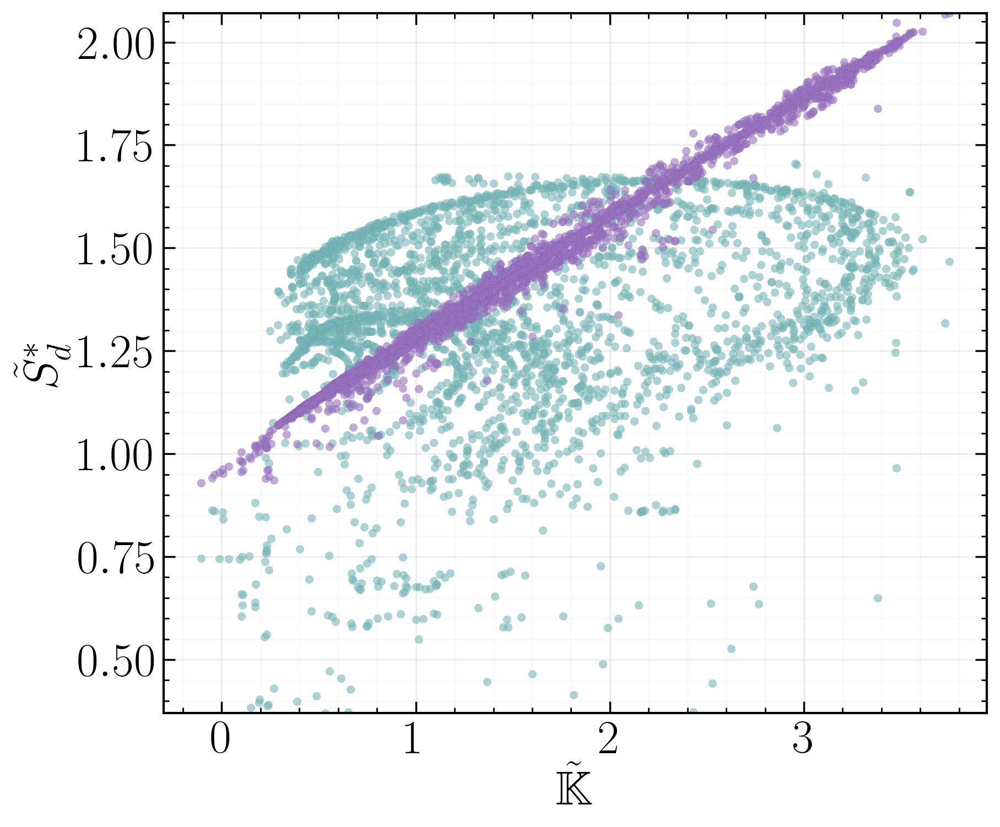

In [16]:
# Positive-curvature model using tabulated Markstein lengths (Sd vs curvature/stretch)
import pandas as pd

MARKSTEIN_TABLE_DIR = PROJECT_ROOT / "data" / "Markstein lengths"
MARKSTEIN_TABLES = sorted(MARKSTEIN_TABLE_DIR.glob("markstein_phi_*_P_*atm_*_c_*_Tiso_*K.csv"))
if not MARKSTEIN_TABLES:
    # Backward compatibility with older exports.
    MARKSTEIN_TABLES = sorted(MARKSTEIN_TABLE_DIR.glob("markstein_phi_*.csv"))
if not MARKSTEIN_TABLES:
    raise FileNotFoundError(f"No Markstein tables found in {MARKSTEIN_TABLE_DIR}")

def _token_to_float(token: str) -> float:
    return float(token.replace("p", "."))

def _parse_markstein_filename(path: Path) -> dict:
    # Expected new format:
    # markstein_phi_{phi}_P_{P}atm_{iso_mode}_c_{c}_Tiso_{T}K.csv
    parts = path.stem.split("_")
    try:
        return {
            "phi": _token_to_float(parts[2]),
            "P_atm": _token_to_float(parts[4].replace("atm", "")),
            "iso_mode": parts[5],
            "c_iso": _token_to_float(parts[7]),
            "T_iso_K": _token_to_float(parts[9].replace("K", "")),
        }
    except (IndexError, ValueError):
        return {}

target_c = float(PROGRESS_LEVELS[0]) if PROGRESS_LEVELS else 0.5
phi_tol = 1.1e-2  # match files saved with two-decimal phi tag
scored = []
for p in MARKSTEIN_TABLES:
    meta = _parse_markstein_filename(p)
    if not meta:
        continue
    if abs(float(meta["phi"]) - PHI) <= phi_tol:
        score = abs(float(meta["c_iso"]) - target_c)
        scored.append((score, abs(float(meta["P_atm"]) - 1.0), p))

if scored:
    scored.sort(key=lambda x: (x[0], x[1], x[2].name))
    markstein_path = scored[0][2]
else:
    phi_token_new = f"phi_{PHI:.2f}".replace(".", "p")
    phi_token_old = f"phi_{PHI:.2f}"
    markstein_path = next(
        (p for p in MARKSTEIN_TABLES if (phi_token_new in p.name or phi_token_old in p.name)),
        MARKSTEIN_TABLES[0],
    )
    print(f"Markstein table for phi={PHI:.2f} not found exactly; using {markstein_path.name}")

markstein_df = pd.read_csv(markstein_path)
if {"M_curvature", "M_stretch"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "M_curvature", "M_stretch"
elif {"L_curv_nd", "L_stretch_nd"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "L_curv_nd", "L_stretch_nd"
elif {"L_cur", "L_str"}.issubset(markstein_df.columns):
    l_cur_col, l_str_col = "L_cur", "L_str"
else:
    raise ValueError(
        "Markstein table must contain one of: "
        "(M_curvature, M_stretch), (L_curv_nd, L_stretch_nd), or (L_cur, L_str)."
    )
require_columns(markstein_df, ["progress", l_cur_col, l_str_col], context="Markstein table:")


def lookup_markstein_lengths(progress_value: float) -> tuple[float, float, float]:
    diffs = (markstein_df["progress"] - progress_value).abs()
    idx = int(diffs.idxmin())
    row = markstein_df.loc[idx]
    return float(row[l_cur_col]), float(row[l_str_col]), float(row["progress"])


for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        l_curv, l_str, c_match = lookup_markstein_lengths(float(c_val))
        print(
            f"t={t}, T={float(c_val):.2f} (progress={c_match:.4f}): Sd = 1 - {l_curv:.3e}*curvature - {l_str:.3e}*stretch_rate"
        )

        savepath = None
        if SAVE_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, FIT_OUT_DIR, "tabulated")
            savepath = out_dir / "tabulated_fit_diagnostics"

        plot_fit_diagnostics(
            pos_df,
            l_curv=l_curv,
            l_str=l_str,
            curv_col=CURVATURE_COLUMN,
            stretch_col=STRETCH_COLUMN,
            target_col=TARGET_COLUMN,
            plot_kind="sd_vs_curvature",
            savepath=savepath,
        )
        plot_fit_diagnostics(
            pos_df,
            l_curv=l_curv,
            l_str=l_str,
            curv_col=CURVATURE_COLUMN,
            stretch_col=STRETCH_COLUMN,
            target_col=TARGET_COLUMN,
            plot_kind="sd_vs_stretch",
            savepath=savepath,
        )


Negative-curvature model fit (constant C).


In [17]:
# Negative-curvature model check: Sd = 1 - (1/T) * curvature * alpha * (1+C) / (S_L * L_ref)
TARGET_COLUMN = "DW_FDS"
TEMP_COLUMN = "T"
THERMAL_DIFF_COLUMN = "thermal_diffusivity"
S_L_COLUMN = "S_L"
L_REF_COLUMN = "L_ref"

def fit_c_constant(df: pd.DataFrame, *, s_l: float, l_ref: float) -> tuple[float, np.ndarray, float, float]:
    temp = df[TEMP_COLUMN].to_numpy()
    curv = df[CURVATURE_COLUMN].to_numpy()
    alpha = df[THERMAL_DIFF_COLUMN].to_numpy() 
    denom = temp * s_l * l_ref
    scale = alpha / denom

    y_true = df[TARGET_COLUMN].to_numpy()
    y_fit = 1.0 - y_true

    model = LinearRegression(fit_intercept=False)
    model.fit(curv.reshape(-1, 1), y_fit)
    slope = float(model.coef_[0])

    scale_mean = float(scale.mean())
    if scale_mean == 0.0 or not np.isfinite(scale_mean):
        raise ValueError("Invalid fit: mean alpha/(l_ref*S_L*T) is zero or non-finite")

    c_est = slope / scale_mean - 1.0
    y_pred = 1.0 - slope * curv
    ss_res = float(((y_true - y_pred) ** 2).sum())
    ss_tot = float(((y_true - y_true.mean()) ** 2).sum())
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return c_est, y_pred, r2, rmse


for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])

        need_cols = [CURVATURE_COLUMN, TEMP_COLUMN, THERMAL_DIFF_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()


        c_est, y_pred, r2, rmse = fit_c_constant(neg_df, s_l=s_l, l_ref=l_ref)
        print(
            f"t={t}, T={float(c_val):.2f}: C={c_est:.3e}, R^2={r2:.3f}, RMSE={rmse:.3e}"
        )


t=200, T=0.60: C=-4.181e-01, R^2=0.542, RMSE=2.917e-01


Negative-curvature diagnostic plot functions.


In [18]:
# Negative-curvature diagnostics plot functions
import matplotlib.pyplot as plt

SAVE_NEG_FIT_PLOTS = True
NEG_FIT_OUT_DIR = "fit_plots"
DIAG_SCATTER_S = 18
DIAG_ALPHA = 0.6
LINE_WIDTH = 2.2
LEGEND_KWARGS = dict(
    markerscale=2.0,
    frameon=False,
    fontsize=PLOT_FONT_SIZE - 2,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.10),
    ncol=2,
    borderaxespad=0.0,
)


def plot_negative_fit_diagnostics(
    df: pd.DataFrame,
    y_pred: np.ndarray,
    plot_kind: str,
    savepath: Path | None = None,
    y_pred_alt: np.ndarray | None = None,
    y_pred_alt_label: str = "C=0.5",
) -> None:
    y_true = df[TARGET_COLUMN].to_numpy()
    mask_inputs = [y_true, y_pred]
    if y_pred_alt is not None:
        mask_inputs.append(y_pred_alt)
    mask, sd_bounds = sd_joint_percentile_mask(*mask_inputs)
    if sd_bounds is None:
        print("plot_negative_fit_diagnostics: skipped (no points in joint Sd percentile range)")
        return
    df_plot = df.loc[df.index[mask]].copy()
    y_true_plot = y_true[mask]
    y_pred_plot = y_pred[mask]
    y_pred_alt_plot = y_pred_alt[mask] if y_pred_alt is not None else None

    if plot_kind == "pred_vs_true":
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            y_true_plot,
            y_pred_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Data",
        )
        lim_min = float(min(y_true_plot.min(), y_pred_plot.min()))
        lim_max = float(max(y_true_plot.max(), y_pred_plot.max()))
        ax.plot(
            [lim_min, lim_max],
            [lim_min, lim_max],
            linestyle="--",
            color=COLOR_LINE,
            linewidth=LINE_WIDTH,
            label="1:1",
        )
        ax.set_xlabel(f"{LABEL_SD} (true)")
        ax.set_ylabel(f"{LABEL_SD} (pred)")
        style_axes(ax, equal=True)
        if savepath is not None:
            savepath.parent.mkdir(parents=True, exist_ok=True)
            save_multi_fig(fig, savepath, "pred_vs_true")
        plt.show()
        plt.close(fig)
    elif plot_kind == "sd_vs_curvature":
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        ax.scatter(
            df_plot[CURVATURE_COLUMN],
            y_true_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_DATA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Data",
        )
        ax.scatter(
            df_plot[CURVATURE_COLUMN],
            y_pred_plot,
            s=DIAG_SCATTER_S,
            alpha=DIAG_ALPHA,
            color=COLOR_PRED,
            edgecolors=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            label="Prediction",
        )
        if y_pred_alt_plot is not None:
            ax.scatter(
                df_plot[CURVATURE_COLUMN],
                y_pred_alt_plot,
                s=DIAG_SCATTER_S,
                alpha=DIAG_ALPHA,
                color=COLOR_NEUTRAL,
                edgecolors=COLOR_LINE,
                linewidths=SCATTER_LINEWIDTH,
                label=y_pred_alt_label,
            )
        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        legend_kwargs = dict(LEGEND_KWARGS)
        if y_pred_alt_plot is not None:
            legend_kwargs["ncol"] = 3
        style_axes(ax)
        ax.set_ylim(*sd_bounds)
        if savepath is not None:
            save_multi_fig(fig, savepath, "sd_vs_curvature")
        plt.show()
        plt.close(fig)
    else:
        raise ValueError(f"Unknown plot_kind: {plot_kind}")
        raise ValueError(f"Unknown plot_kind: {plot_kind}")


Negative-curvature diagnostics: predicted vs true.


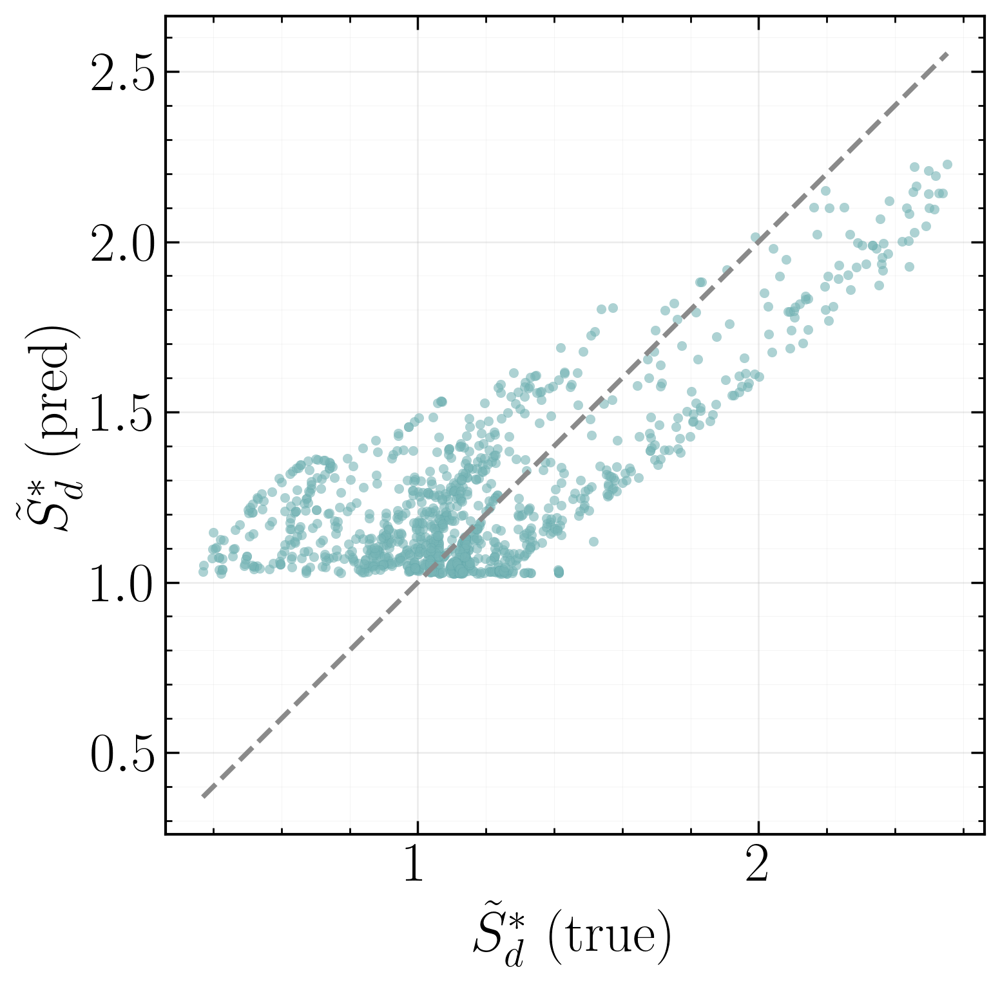

In [19]:
# Negative-curvature diagnostics (pred vs true)
import matplotlib.pyplot as plt

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])

        need_cols = [CURVATURE_COLUMN, TEMP_COLUMN, THERMAL_DIFF_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()

        _, y_pred, _, _ = fit_c_constant(neg_df, s_l=s_l, l_ref=l_ref)
        savepath = None
        if SAVE_NEG_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, NEG_FIT_OUT_DIR)
            savepath = out_dir / "neg_fit_diagnostics"

        plot_negative_fit_diagnostics(
            neg_df,
            y_pred=y_pred,
            plot_kind="pred_vs_true",
            savepath=savepath,
        )


Negative-curvature diagnostics: Sd vs curvature.


0.0007445717562763
0.1768171112466728


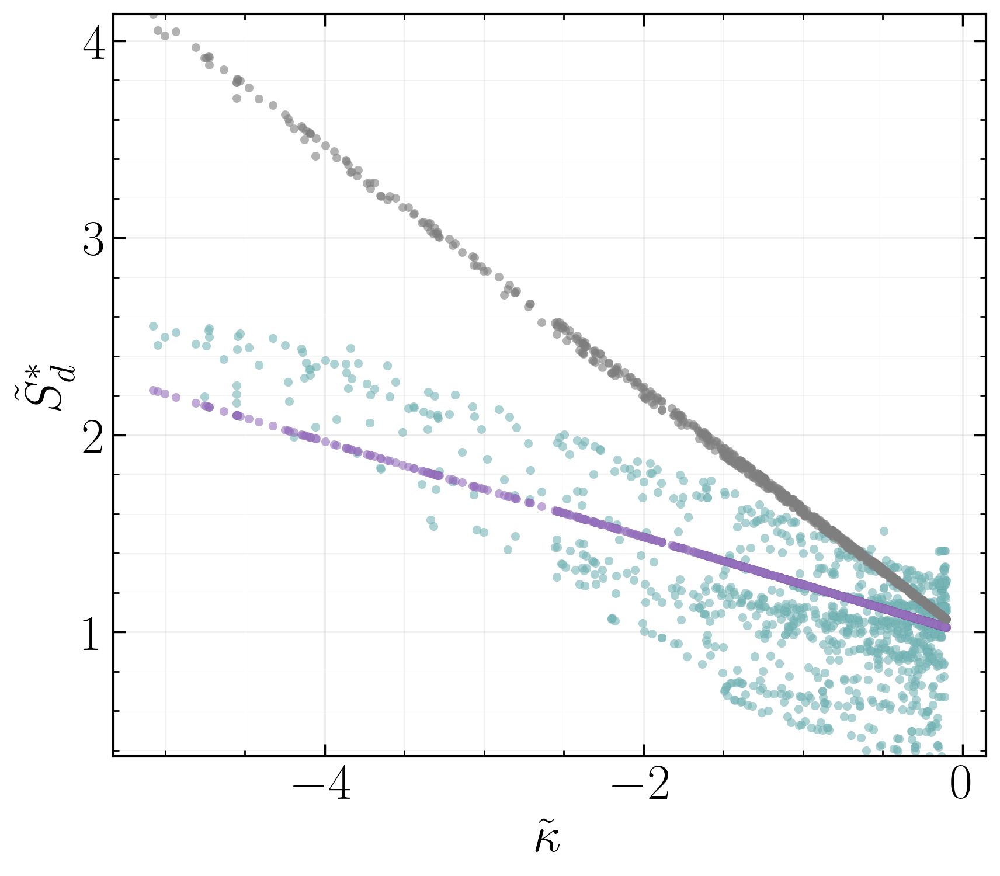

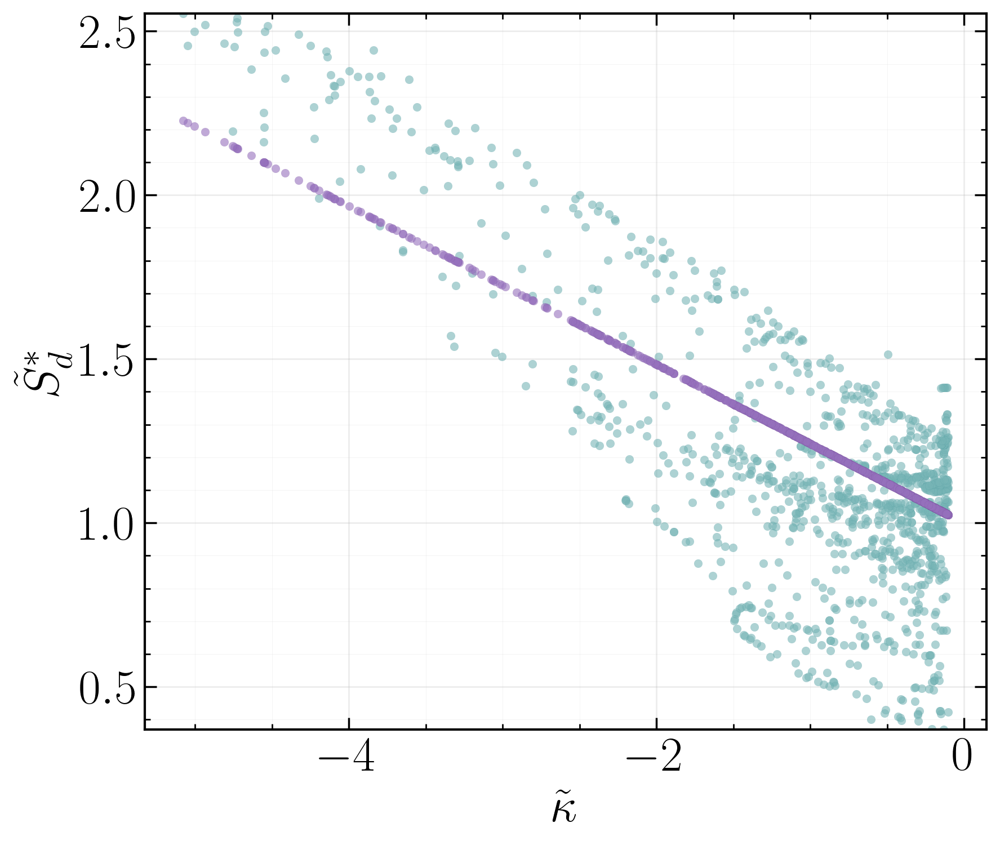

In [20]:
# Negative-curvature diagnostics (Sd vs curvature)
import matplotlib.pyplot as plt

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])
        print(l_ref)
        print(s_l)
        need_cols = [CURVATURE_COLUMN, TEMP_COLUMN, THERMAL_DIFF_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()

        _, y_pred, _, _ = fit_c_constant(neg_df, s_l=s_l, l_ref=l_ref)
        temp = neg_df[TEMP_COLUMN].to_numpy()
        curv = neg_df[CURVATURE_COLUMN].to_numpy()
        alpha = neg_df[THERMAL_DIFF_COLUMN].to_numpy()
        denom = temp * s_l * l_ref
        y_pred_c05 = 1.0 - (curv * alpha) / denom * (1.0 + 0.5)

        savepath = None
        if SAVE_NEG_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, NEG_FIT_OUT_DIR)
            savepath = out_dir / "neg_fit_diagnostics"

        plot_negative_fit_diagnostics(
            neg_df,
            y_pred=y_pred,
            plot_kind="sd_vs_curvature",
            savepath=savepath,
            y_pred_alt=y_pred_c05,
            y_pred_alt_label="C=0.5",
        )

        savepath_no_c05 = None
        if SAVE_NEG_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, NEG_FIT_OUT_DIR)
            savepath_no_c05 = out_dir / "neg_fit_diagnostics_no_c05"

        plot_negative_fit_diagnostics(
            neg_df,
            y_pred=y_pred,
            plot_kind="sd_vs_curvature",
            savepath=savepath_no_c05,
        )


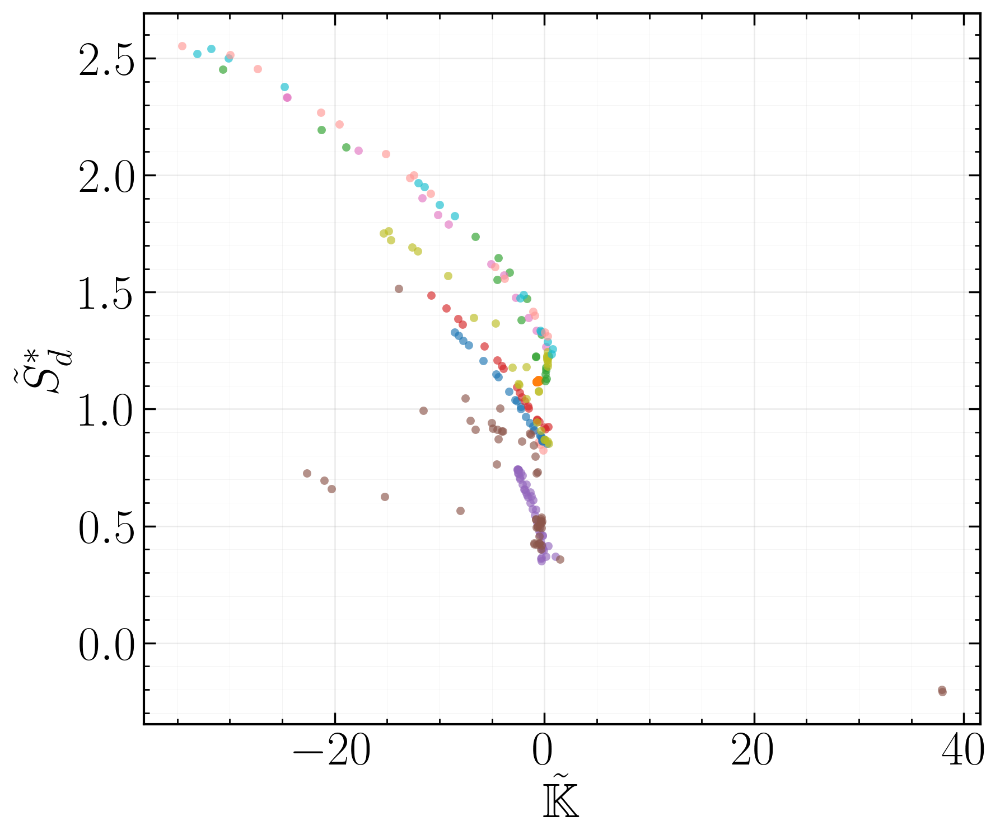

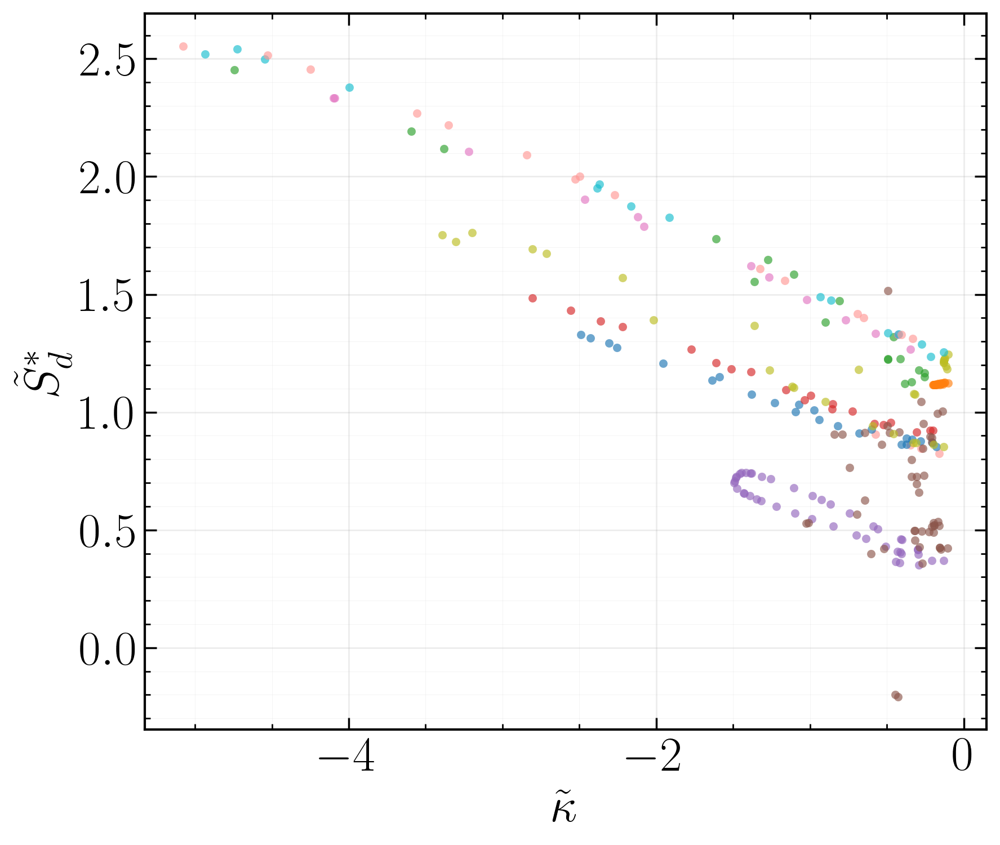

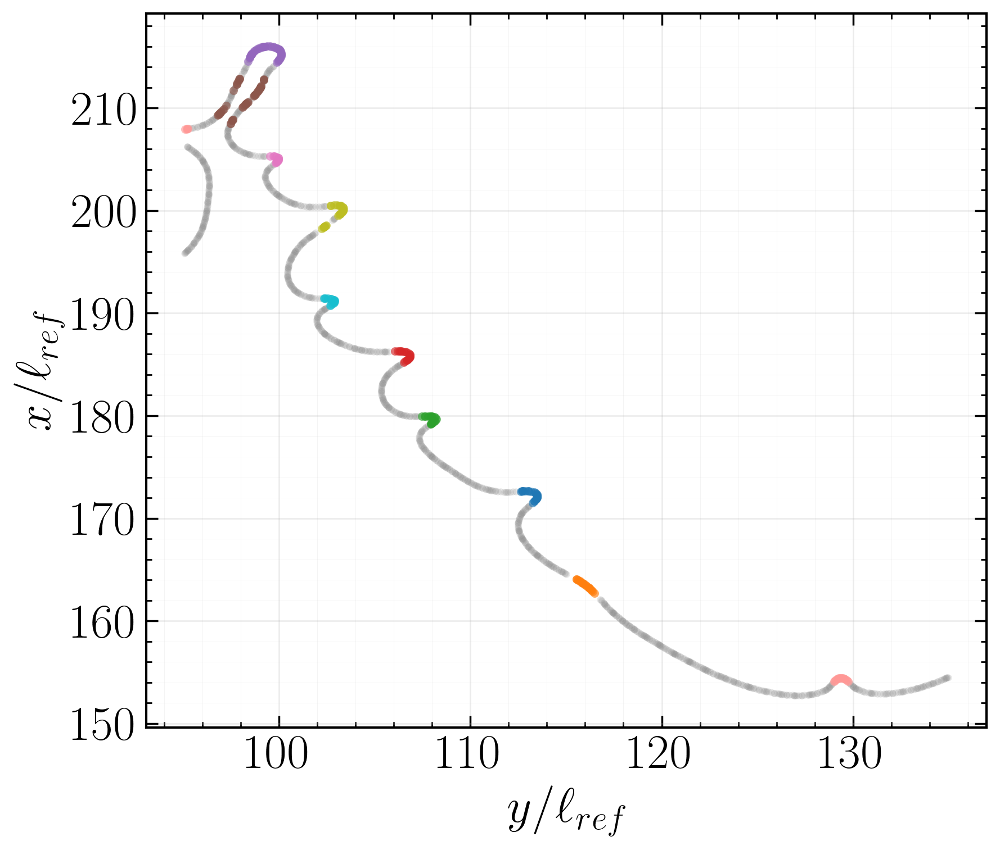

In [21]:
# Negative-curvature clustering in the x-y plane
import math
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

TARGET_COLUMN = "DW_FDS"
STRETCH_COLUMN = "stretch_rate"

SAVE_NEG_CLUSTER_PLOTS = True
NEG_CLUSTER_OUT_DIR = "neg_cluster_plots"
CLUSTER_SCATTER_S = 18
CLUSTER_ALPHA = 0.65
NONNEG_COLOR = "#8c8c8c"
CLUSTER_COLORS = [
    "#1f77b4",
    "#ff7f0e",
    "#2ca02c",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#bcbd22",
    "#17becf",
    "#ff9896",
]
N_CLUSTERS = 10
DBSCAN_EPS = 0.1
DBSCAN_MIN_SAMPLES = 5
Y_MIN = 95
Y_MAX = 135
SHADED_ALPHA = 0.2
SHADED_S = 12
CLUSTER_LEGEND_KWARGS = dict(
    frameon=False,
    fontsize=PLOT_FONT_SIZE - 4,
    loc="lower center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=4,
    borderaxespad=0.0,
    markerscale=2.2,
)


def plot_cluster_scatter(
    df: pd.DataFrame,
    x_col: str,
    y_col: str,
    xlabel: str,
    ylabel: str,
    savepath: Path | None,
    suffix: str,
    shaded: list[tuple[pd.DataFrame, str, str]] | None = None,
    show_legend: bool = True,
) -> None:
    labels = df["cluster"].to_numpy()
    uniq = np.unique(labels)

    fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
    for label in uniq:
        mask = labels == label
        color = CLUSTER_COLORS[int(label) % len(CLUSTER_COLORS)]
        legend_label = f"cluster {label}"
        ax.scatter(
            df.loc[mask, x_col],
            df.loc[mask, y_col],
            s=CLUSTER_SCATTER_S,
            alpha=CLUSTER_ALPHA,
            color=color,
            edgecolors=color,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
            label=legend_label,
        )
    if shaded:
        for s_df, color, label in shaded:
            if s_df.empty:
                continue
            ax.scatter(
                s_df[x_col],
                s_df[y_col],
                s=SHADED_S,
                alpha=SHADED_ALPHA,
                color=color,
                edgecolors=color,
                linewidths=SCATTER_LINEWIDTH,
                zorder=1,
                label=label,
            )
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    style_axes(ax)
    if savepath is not None:
        savepath.parent.mkdir(parents=True, exist_ok=True)
        save_multi_fig(fig, savepath, suffix)
    plt.show()
    plt.close(fig)


# Ordering helper retained for potential reuse

def _ordered_legend(handles, labels):
    pairs = list(zip(handles, labels))

    cluster_pairs = []
    other_pairs = []
    for h, lab in pairs:
        if lab.startswith("cluster "):
            try:
                cluster_id = int(lab.split()[-1])
            except ValueError:
                cluster_id = 1_000_000
            cluster_pairs.append((cluster_id, h, lab))
        else:
            other_pairs.append((h, lab))

    cluster_pairs.sort(key=lambda item: item[0])
    ordered = [(h, lab) for _, h, lab in cluster_pairs]

    nonneg = [(h, lab) for h, lab in other_pairs if lab == "non-negative"]
    other_rest = [(h, lab) for h, lab in other_pairs if lab != "non-negative"]
    ordered.extend(other_rest)
    ordered.extend(nonneg)

    # Normalize non-negative legend marker size to match clusters
    norm_ordered = []
    for h, lab in ordered:
        if lab == "non-negative":
            norm_ordered.append((Line2D([], [], marker="o", linestyle="",
                                      color=NONNEG_COLOR, markerfacecolor=NONNEG_COLOR,
                                      markersize=math.sqrt(CLUSTER_SCATTER_S)), lab))
        else:
            norm_ordered.append((h, lab))
    ordered = norm_ordered

    handles = [h for h, _ in ordered]
    labels = [lab for _, lab in ordered]
    return handles, labels


def _plot_cluster_scatter_ax(
    ax,
    df: pd.DataFrame,
    x_col: str,
    y_col: str,
    xlabel: str,
    ylabel: str,
    shaded: list[tuple[pd.DataFrame, str, str]] | None = None,
) -> tuple[list, list]:
    labels = df["cluster"].to_numpy()
    uniq = np.unique(labels)

    for label in uniq:
        mask = labels == label
        color = CLUSTER_COLORS[int(label) % len(CLUSTER_COLORS)]
        legend_label = f"cluster {label}"
        ax.scatter(
            df.loc[mask, x_col],
            df.loc[mask, y_col],
            s=CLUSTER_SCATTER_S,
            alpha=CLUSTER_ALPHA,
            color=color,
            edgecolors=color,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
            label=legend_label,
        )
    if shaded:
        for s_df, color, label in shaded:
            if s_df.empty:
                continue
            ax.scatter(
                s_df[x_col],
                s_df[y_col],
                s=SHADED_S,
                alpha=SHADED_ALPHA,
                color=color,
                edgecolors=color,
                linewidths=SCATTER_LINEWIDTH,
                zorder=1,
                label=label,
            )

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    handles, labels = ax.get_legend_handles_labels()
    return _ordered_legend(handles, labels)


def plot_cluster_pair(
    df: pd.DataFrame,
    left: tuple[str, str, str, str],
    right: tuple[str, str, str, str],
    savepath: Path | None,
    suffix: str,
    shaded_left: list[tuple[pd.DataFrame, str, str]] | None = None,
    shaded_right: list[tuple[pd.DataFrame, str, str]] | None = None,
) -> None:
    fig, axes = plt.subplots(1, 2, figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)

    _ = _plot_cluster_scatter_ax(
        axes[0],
        df,
        x_col=left[0],
        y_col=left[1],
        xlabel=left[2],
        ylabel=left[3],
        shaded=shaded_left,
    )
    _ = _plot_cluster_scatter_ax(
        axes[1],
        df,
        x_col=right[0],
        y_col=right[1],
        xlabel=right[2],
        ylabel=right[3],
        shaded=shaded_right,
    )

    for ax in axes:
        style_axes(ax)
    if savepath is not None:
        savepath.parent.mkdir(parents=True, exist_ok=True)
        save_multi_fig(fig, savepath, suffix)
    plt.show()
    plt.close(fig)


def crop_by_y(df: pd.DataFrame, y_min: float | None, y_max: float | None) -> pd.DataFrame:
    if y_min is None and y_max is None:
        return df
    mask = pd.Series(True, index=df.index)
    if y_min is not None:
        mask &= df["y"] >= y_min
    if y_max is not None:
        mask &= df["y"] <= y_max
    return df.loc[mask].copy()


for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()
        need_cols = ["x", "y", CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()
        neg_df = crop_by_y(neg_df, Y_MIN, Y_MAX)
        if neg_df.empty:
            continue

        xy = neg_df[["x", "y"]].to_numpy()
        xy_scaled = StandardScaler().fit_transform(xy)
        labels = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES).fit_predict(xy_scaled)
        neg_df["cluster"] = labels

        savepath = None
        if SAVE_NEG_CLUSTER_PLOTS:
            out_dir = case_out_dir(t, c_val, NEG_CLUSTER_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            savepath = out_dir / "neg_cluster"

        plot_cluster_scatter(
            neg_df,
            x_col=STRETCH_COLUMN,
            y_col=TARGET_COLUMN,
            xlabel=LABEL_STRETCH,
            ylabel=LABEL_SD,
            savepath=savepath,
            suffix="sd_vs_stretch",
        )

        nonneg_df = dfv[dfv[CURVATURE_COLUMN] >= 0.0].copy()
        nonneg_df = crop_by_y(nonneg_df, Y_MIN, Y_MAX)
        shaded = [
            (nonneg_df, NONNEG_COLOR, "non-negative"),
        ]
        plot_cluster_scatter(
            neg_df,
            x_col=CURVATURE_COLUMN,
            y_col=TARGET_COLUMN,
            xlabel=LABEL_CURV,
            ylabel=LABEL_SD,
            savepath=savepath,
            suffix="sd_vs_curvature",
            show_legend=False,
        )
        plot_cluster_scatter(
            neg_df,
            x_col="y",
            y_col="x",       
            xlabel= r'$y / \ell_{ref}$',
            ylabel= r'$x / \ell_{ref}$',
            savepath=savepath,
            suffix="xy",
            shaded=shaded,
            show_legend=False,
        )


   time_step  iso  cluster         C        R2      RMSE   n
0        200  0.6        3 -0.147469  0.896491  0.138080  15
1        200  0.6        2 -0.668915  0.763620  0.087077  20


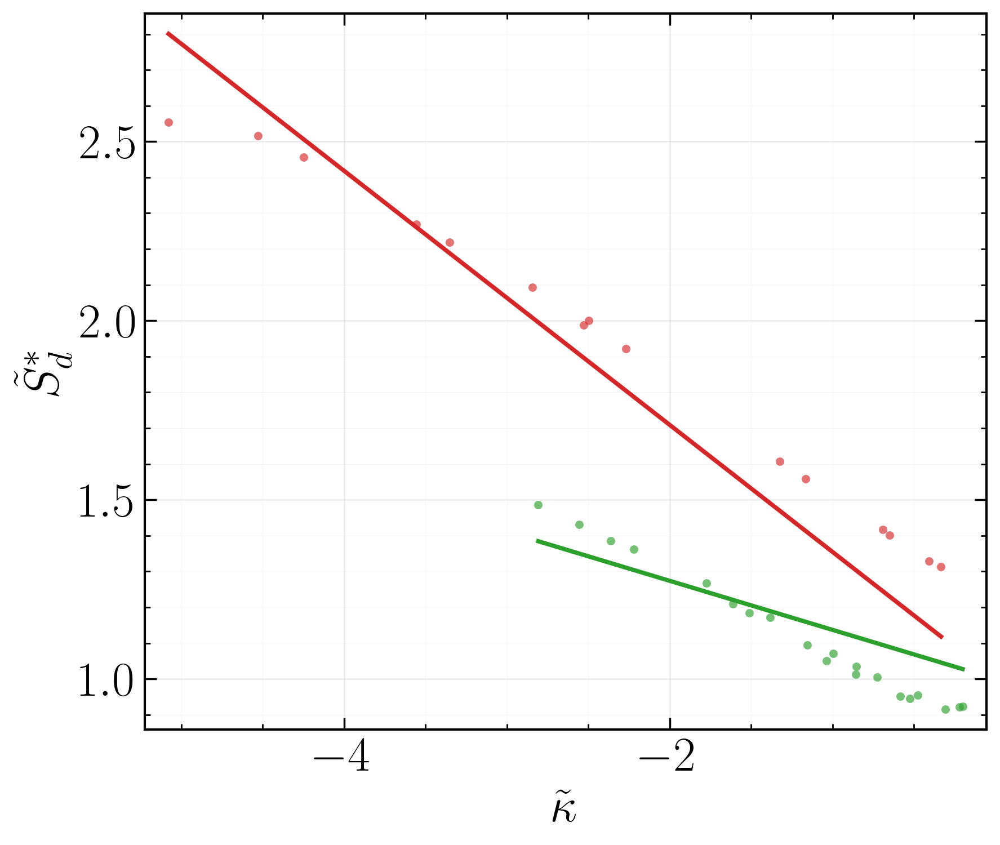

In [22]:
# Cluster-specific negative-curvature fits (selected clusters on one plot)
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
CLUSTER_IDS = [3,2]
SAVE_CLUSTER_FIT_PLOTS = True
CLUSTER_FIT_OUT_DIR = "neg_cluster_fit_plots"
CLUSTER_FIT_LINE_WIDTH = 2.2

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()
        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])

        need_cols = ["x", "y", CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()
        neg_df = crop_by_y(neg_df, Y_MIN, Y_MAX)
        if neg_df.empty:
            continue

        xy = neg_df[["x", "y"]].to_numpy()
        xy_scaled = StandardScaler().fit_transform(xy)
        n_clusters = min(N_CLUSTERS, len(neg_df))
        if n_clusters < 2:
            neg_df["cluster"] = 0
        else:
            kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=0)
            neg_df["cluster"] = kmeans.fit_predict(xy_scaled)

        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        summary_rows = []
        for cluster_id in CLUSTER_IDS:
            cluster_df = neg_df[neg_df["cluster"] == cluster_id].copy()
            if cluster_df.empty:
                continue
            color = CLUSTER_COLORS[int(cluster_id) % len(CLUSTER_COLORS)]
            y_true = cluster_df[TARGET_COLUMN].to_numpy()
            curv = cluster_df[CURVATURE_COLUMN].to_numpy()
            c_est, y_pred, r2, rmse = fit_c_constant(cluster_df, s_l=s_l, l_ref=l_ref)
            order = np.argsort(curv)

            summary_rows.append({
                "time_step": int(t),
                "iso": float(c_val),
                "cluster": int(cluster_id),
                "C": float(c_est),
                "R2": float(r2),
                "RMSE": float(rmse),
                "n": int(len(cluster_df)),
            })

            ax.scatter(
                curv,
                y_true,
                s=CLUSTER_SCATTER_S,
                alpha=CLUSTER_ALPHA,
                color=color,
                edgecolors=color,
                linewidths=SCATTER_LINEWIDTH,
                label=f"cluster {cluster_id}",
            )
            ax.plot(
                curv[order],
                y_pred[order],
                color=color,
                linewidth=CLUSTER_FIT_LINE_WIDTH,
                label=f"cluster {cluster_id} fit",
            )

        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        ax.margins(x=0.03, y=0.03)
        style_axes(ax)

        if summary_rows:
            summary_df = pd.DataFrame(summary_rows)
            print(summary_df)

        if SAVE_CLUSTER_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, CLUSTER_FIT_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            base = out_dir / "cluster_fits"
            fig.savefig(base.with_suffix(".png"), dpi=FIG_DPI)
            fig.savefig(base.with_suffix(".pdf"))
            fig.savefig(base.with_suffix(".svg"))

        plt.show()
        plt.close(fig)


Summary metrics for positive-curvature models.


In [23]:
# Summary: positive-curvature fit accuracy (R^2, RMSE) for all models
summary_rows = []

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(
            pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        )

        curv = pos_df[CURVATURE_COLUMN].to_numpy()
        stretch = pos_df[STRETCH_COLUMN].to_numpy()
        y_true = pos_df[TARGET_COLUMN].to_numpy()

        l_curv, l_str, r2_joint, rmse_joint = fit_markstein_lengths(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        l_curv_seq, l_str_seq, r2_seq, rmse_seq = fit_markstein_lengths_sequential(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        l_curv_huber, l_str_huber, r2_huber, rmse_huber = fit_markstein_lengths_huber(
            pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN
        )
        l_curv_tab, l_str_tab, _ = lookup_markstein_lengths(float(c_val))

        y_pred_tab = 1.0 - (l_curv_tab * curv + l_str_tab * stretch)
        ss_res_tab = float(((y_true - y_pred_tab) ** 2).sum())
        ss_tot_tab = float(((y_true - y_true.mean()) ** 2).sum())
        r2_tab = 1.0 - ss_res_tab / ss_tot_tab if ss_tot_tab > 0 else float("nan")
        rmse_tab = float(np.sqrt(np.mean((y_true - y_pred_tab) ** 2)))

        summary_rows.append({
            "time_step": t,
            "progress": float(c_val),
            "model": "joint",
            "R2": r2_joint,
            "RMSE": rmse_joint,
            "L_curv": l_curv,
            "L_str": l_str,
        })
        summary_rows.append({
            "time_step": t,
            "progress": float(c_val),
            "model": "sequential",
            "R2": r2_seq,
            "RMSE": rmse_seq,
            "L_curv": l_curv_seq,
            "L_str": l_str_seq,
        })
        summary_rows.append({
            "time_step": t,
            "progress": float(c_val),
            "model": "huber",
            "R2": r2_huber,
            "RMSE": rmse_huber,
            "L_curv": l_curv_huber,
            "L_str": l_str_huber,
        })
        summary_rows.append({
            "time_step": t,
            "progress": float(c_val),
            "model": "tabulated",
            "R2": r2_tab,
            "RMSE": rmse_tab,
            "L_curv": l_curv_tab,
            "L_str": l_str_tab,
        })

summary_df = pd.DataFrame(summary_rows)
summary_df = summary_df.sort_values(["time_step", "progress", "model"]).reset_index(drop=True)
display(summary_df)


,time_step,progress,model,R2,RMSE,L_curv,L_str
0,200,0.6,huber,-0.357451,0.242253,0.308615,-0.247711
1,200,0.6,joint,-0.357312,0.242241,0.340354,-0.254346
2,200,0.6,sequential,-0.372105,0.243557,0.014881,-0.186035
3,200,0.6,tabulated,-1.085709,0.300286,0.292625,-0.344973


[BLEND] t=200, T=0.60: L_curv=3.404e-01, L_str=-2.543e-01, C=-4.181e-01 | R^2(all)=-0.596, RMSE(all)=3.446e-01


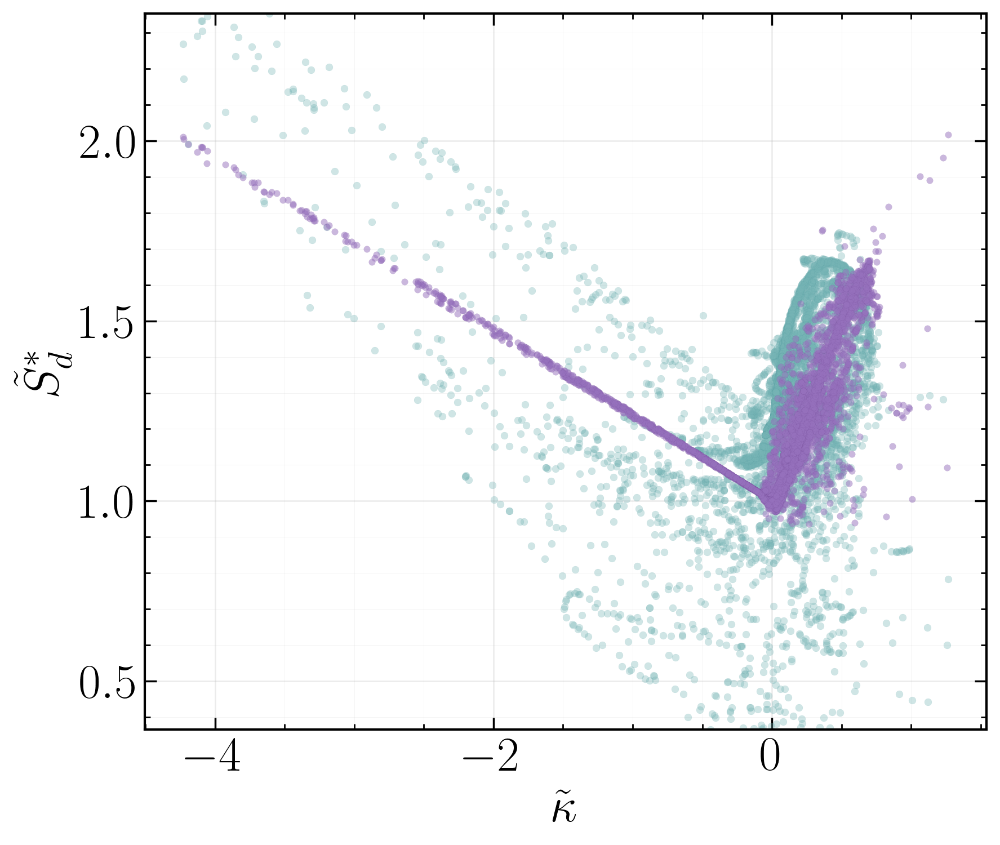

In [24]:
# ============================================================
# Blended curvature-transition model:
#   - Positive-curvature joint regression: Sd = 1 - L_curv*kappa - L_str*K
#   - Negative-curvature C-model:         Sd = 1 - (1+C) * (kappa*alpha)/(T*S_L*L_ref)
#   - Blend between them based on curvature (smoothstep from CURVATURE_LOW -> CURVATURE_HIGH)
# Then plot predictions vs data over the FULL curvature range.
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# (Re)declare column names used by both models (keeps this cell robust)
TARGET_COLUMN = "DW_FDS"
STRETCH_COLUMN = "stretch_rate"
TEMP_COLUMN = "T"
THERMAL_DIFF_COLUMN = "thermal_diffusivity"
S_L_COLUMN = "S_L"
L_REF_COLUMN = "L_ref"


def smoothstep_weight(kappa: np.ndarray, low: float, high: float) -> np.ndarray:
    """
    Returns w in [0,1]:
      w=0 for kappa<=low
      w=1 for kappa>=high
      smooth C1 transition in between
    """
    u = (kappa - low) / (high - low)
    u = np.clip(u, 0.0, 1.0)
    return u * u * (3.0 - 2.0 * u)


def r2_rmse(y_true: np.ndarray, y_pred: np.ndarray) -> tuple[float, float]:
    ss_res = float(np.sum((y_true - y_pred) ** 2))
    ss_tot = float(np.sum((y_true - np.mean(y_true)) ** 2))
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else float("nan")
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return r2, rmse


# If you already defined these in earlier cells, this will reuse them;
# otherwise it provides minimal local fallbacks.
if "fit_markstein_lengths" not in globals():

    def fit_markstein_lengths(
        df: pd.DataFrame,
        curv_col: str,
        stretch_col: str,
        target_col: str,
    ) -> tuple[float, float, float, float]:
        X = df[[curv_col, stretch_col]].to_numpy()
        y_true = df[target_col].to_numpy()
        y_fit = 1.0 - y_true
        model = LinearRegression(fit_intercept=False)
        model.fit(X, y_fit)
        y_pred = 1.0 - model.predict(X)
        r2, rmse = r2_rmse(y_true, y_pred)
        return float(model.coef_[0]), float(model.coef_[1]), r2, rmse

if "fit_c_constant" not in globals():

    def fit_c_constant(df: pd.DataFrame, *, s_l: float, l_ref: float) -> tuple[float, np.ndarray, float, float]:
        temp = df[TEMP_COLUMN].to_numpy()
        curv = df[CURVATURE_COLUMN].to_numpy()
        alpha = df[THERMAL_DIFF_COLUMN].to_numpy()

        denom = temp * s_l * l_ref
        a = (curv * alpha) / denom  # predictor for (1+C)

        y_true = df[TARGET_COLUMN].to_numpy()
        y_fit = 1.0 - y_true

        model = LinearRegression(fit_intercept=False)
        model.fit(a.reshape(-1, 1), y_fit)

        m = float(model.coef_[0])     # m = (1+C)
        c_est = m - 1.0
        y_pred = 1.0 - model.predict(a.reshape(-1, 1))
        r2, rmse = r2_rmse(y_true, y_pred)
        return c_est, y_pred, r2, rmse


# Plot / sampling controls
SAVE_BLEND_PLOTS = True
BLEND_OUT_DIR = "blend_plots"
SCATTER_S = 14
SCATTER_ALPHA = 0.35
MAX_SCATTER_POINTS = 40000
N_BINS = 90

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])

        need_cols = [
            CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN,
            TEMP_COLUMN, THERMAL_DIFF_COLUMN,
        ]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        # --- Fit endpoint models on their intended subsets ---
        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN])
        l_curv, l_str, _, _ = fit_markstein_lengths(pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()
        #neg_df = apply_outlier_filter(neg_df, [CURVATURE_COLUMN, TEMP_COLUMN, THERMAL_DIFF_COLUMN, TARGET_COLUMN])
        c_est, _, _, _ = fit_c_constant(neg_df, s_l=s_l, l_ref=l_ref)

        # --- Predict on the full curvature range ---
        kappa = dfv[CURVATURE_COLUMN].to_numpy()
        K = dfv[STRETCH_COLUMN].to_numpy()
        y_true = dfv[TARGET_COLUMN].to_numpy()

        Tloc = dfv[TEMP_COLUMN].to_numpy()
        alpha = dfv[THERMAL_DIFF_COLUMN].to_numpy() *1e-04 #Convert to m^2/s

        a = (kappa * alpha) / (Tloc * s_l * l_ref)
        y_neg = 1.0 - (1.0 + c_est) * a
        y_pos = 1.0 - (l_curv * kappa + l_str * K)

        w = smoothstep_weight(kappa, CURVATURE_LOW, CURVATURE_HIGH)
        y_blend = (1.0 - w) * y_neg + w * y_pos

        r2_all, rmse_all = r2_rmse(y_true, y_blend)
        print(
            f"[BLEND] t={t}, T={float(c_val):.2f}: "
            f"L_curv={l_curv:.3e}, L_str={l_str:.3e}, C={c_est:.3e} | "
            f"R^2(all)={r2_all:.3f}, RMSE(all)={rmse_all:.3e}"
        )

        # --- Downsample for scatter (if needed) ---
        if len(dfv) > MAX_SCATTER_POINTS:
            df_sc = dfv.sample(MAX_SCATTER_POINTS, random_state=0)
        else:
            df_sc = dfv

        k_sc = df_sc[CURVATURE_COLUMN].to_numpy()
        y_sc = df_sc[TARGET_COLUMN].to_numpy()

        # recompute blended prediction for the sampled points
        K_sc = df_sc[STRETCH_COLUMN].to_numpy()
        T_sc = df_sc[TEMP_COLUMN].to_numpy()
        a_sc = (k_sc * df_sc[THERMAL_DIFF_COLUMN].to_numpy()) / (T_sc * s_l * l_ref)
        y_neg_sc = 1.0 - (1.0 + c_est) * a_sc
        y_pos_sc = 1.0 - (l_curv * k_sc + l_str * K_sc)
        w_sc = smoothstep_weight(k_sc, CURVATURE_LOW, CURVATURE_HIGH)
        y_blend_sc = (1.0 - w_sc) * y_neg_sc + w_sc * y_pos_sc
        mask_sc, sd_bounds = sd_joint_percentile_mask(y_sc, y_blend_sc)
        if sd_bounds is None:
            print(f"[BLEND] t={t}, T={float(c_val):.2f}: skipped (no points in joint Sd percentile range)")
            continue
        k_sc = k_sc[mask_sc]
        y_sc = y_sc[mask_sc]
        y_blend_sc = y_blend_sc[mask_sc]

        # --- Binned trend lines for readability ---
        order = np.argsort(kappa)
        k_sorted = kappa[order]
        y_true_sorted = y_true[order]
        y_blend_sorted = y_blend[order]

        edges = np.linspace(float(k_sorted.min()), float(k_sorted.max()), N_BINS + 1)
        bin_id = np.digitize(k_sorted, edges) - 1
        bin_id = np.clip(bin_id, 0, N_BINS - 1)

        k_bin = np.array([np.mean(k_sorted[bin_id == i]) if np.any(bin_id == i) else np.nan for i in range(N_BINS)])
        yt_bin = np.array([np.mean(y_true_sorted[bin_id == i]) if np.any(bin_id == i) else np.nan for i in range(N_BINS)])
        yp_bin = np.array([np.mean(y_blend_sorted[bin_id == i]) if np.any(bin_id == i) else np.nan for i in range(N_BINS)])
        keep = np.isfinite(k_bin) & np.isfinite(yt_bin) & np.isfinite(yp_bin)
        k_bin, yt_bin, yp_bin = k_bin[keep], yt_bin[keep], yp_bin[keep]

        # --- Plot: Sd vs curvature (data + blended prediction) ---
        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        style_axes(ax)

        ax.scatter(
            k_sc, y_sc,
            s=SCATTER_S, alpha=SCATTER_ALPHA,
            facecolor=COLOR_DATA, edgecolor=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH, label="Data"
        )
        ax.scatter(
            k_sc, y_blend_sc,
            s=SCATTER_S * 0.8, alpha=min(0.8, SCATTER_ALPHA + 0.15),
            facecolor=COLOR_PRED, edgecolor=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH, label="Blended model"
        )


        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        ax.set_ylim(*sd_bounds)

        if SAVE_BLEND_PLOTS:
            out_dir = case_out_dir(t, float(c_val), BLEND_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            base = out_dir / "sd_vs_curvature_blended"
            save_multi_fig(fig, base, "blend")

        plt.show()


In [25]:
# Linear model for each negative-curvature cluster: Sd = alpha * kappa + beta
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

CLUSTER_LIN_FIT_ROWS = []
CLUSTER_POINT_MAP = {}

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = ["x", "y", CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()
        neg_df = crop_by_y(neg_df, Y_MIN, Y_MAX)
        if neg_df.empty:
            continue

        xy = neg_df[["x", "y"]].to_numpy()
        xy_scaled = StandardScaler().fit_transform(xy)
        n_clusters = min(N_CLUSTERS, len(neg_df))
        if n_clusters < 2:
            neg_df["cluster"] = 0
        else:
            kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=0)
            neg_df["cluster"] = kmeans.fit_predict(xy_scaled)

        for cluster_id in sorted(neg_df["cluster"].unique()):
            cluster_df = neg_df[neg_df["cluster"] == cluster_id].copy()
            if len(cluster_df) < 2:
                continue

            curv = cluster_df[CURVATURE_COLUMN].to_numpy().reshape(-1, 1)
            sd = cluster_df[TARGET_COLUMN].to_numpy()

            model = LinearRegression()
            model.fit(curv, sd)

            y_pred = model.predict(curv)
            alpha = float(model.coef_[0])
            beta = float(model.intercept_)
            r2 = float(r2_score(sd, y_pred))
            rmse = float(np.sqrt(mean_squared_error(sd, y_pred)))

            CLUSTER_LIN_FIT_ROWS.append({
                "time_step": int(t),
                "iso": float(c_val),
                "cluster": int(cluster_id),
                "alpha": alpha,
                "beta": beta,
                "R2": r2,
                "RMSE": rmse,
                "n": int(len(cluster_df)),
            })

            CLUSTER_POINT_MAP[(int(t), float(c_val), int(cluster_id))] = (
                cluster_df[CURVATURE_COLUMN].to_numpy(),
                cluster_df[TARGET_COLUMN].to_numpy(),
            )

cluster_lin_fit_df = pd.DataFrame(CLUSTER_LIN_FIT_ROWS)
if cluster_lin_fit_df.empty:
    print("No negative-curvature cluster fits were found.")
else:
    print(cluster_lin_fit_df)


   time_step  iso  cluster     alpha      beta        R2      RMSE   n
0        200  0.6        0 -0.128907  0.647209  0.009265  0.300891  44
1        200  0.6        1 -0.210082  0.796988  0.987707  0.017511  23
2        200  0.6        2 -0.229410  0.841958  0.991749  0.016269  20
3        200  0.6        3 -0.281642  1.243461  0.990253  0.042371  15
4        200  0.6        4 -0.215405  1.011292  0.728859  0.143895  29
5        200  0.6        5 -0.241491  0.355073  0.777404  0.060748  53
6        200  0.6        6  0.107055  1.136726  0.723469  0.001847  21
7        200  0.6        7 -0.281872  1.197095  0.996626  0.020733  13
8        200  0.6        8 -0.280507  1.229683  0.992035  0.042867  15
9        200  0.6        9 -0.298463  1.125870  0.959754  0.078461  18


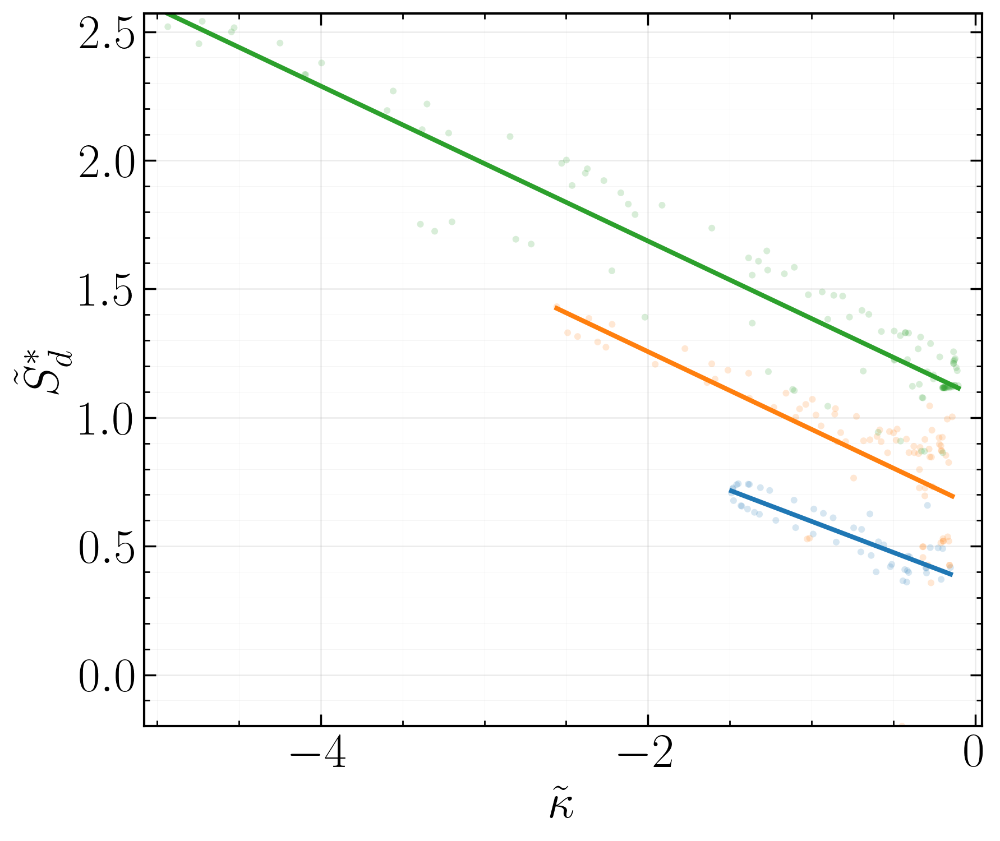

In [26]:
# Group clusters into three beta-based groups, fit group curves, and plot
from sklearn.cluster import KMeans

SAVE_GROUP_FIT_PLOTS = True
GROUP_FIT_OUT_DIR = "neg_cluster_group_fits"
GROUP_LINE_WIDTH = 2.4
GROUP_POINT_ALPHA = 0.18
GROUP_POINT_S = 12
GROUP_COLORS = ["#1f77b4", "#ff7f0e", "#2ca02c"]

if cluster_lin_fit_df.empty:
    print("No cluster fits available for beta grouping.")
else:
    for (t, c_val), df_tc in cluster_lin_fit_df.groupby(["time_step", "iso"]):
        df_tc = df_tc.copy()
        n_groups = min(3, len(df_tc))
        if n_groups < 1:
            continue

        betas = df_tc["beta"].to_numpy().reshape(-1, 1)
        if n_groups == 1:
            labels = np.zeros(len(df_tc), dtype=int)
        else:
            kmeans = KMeans(n_clusters=n_groups, n_init=10, random_state=0)
            labels = kmeans.fit_predict(betas)

        df_tc["beta_group"] = labels
        ordered_groups = (
            df_tc.groupby("beta_group")["beta"].mean().sort_values().index.to_list()
        )
        group_map = {g: i for i, g in enumerate(ordered_groups)}
        df_tc["beta_group"] = df_tc["beta_group"].map(group_map)

        if n_groups == 3:
            group_names = ["low beta", "mid beta", "high beta"]
        elif n_groups == 2:
            group_names = ["low beta", "high beta"]
        else:
            group_names = ["all beta"]

        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)

        for group_id in range(n_groups):
            group_rows = df_tc[df_tc["beta_group"] == group_id]
            if group_rows.empty:
                continue

            curv_list = []
            sd_list = []
            for _, row in group_rows.iterrows():
                key = (int(row["time_step"]), float(row["iso"]), int(row["cluster"]))
                curv, sd = CLUSTER_POINT_MAP.get(key, (np.array([]), np.array([])))
                if curv.size == 0:
                    continue
                curv_list.append(curv)
                sd_list.append(sd)

            if not curv_list:
                continue

            curv_all = np.concatenate(curv_list)
            sd_all = np.concatenate(sd_list)

            model = LinearRegression()
            model.fit(curv_all.reshape(-1, 1), sd_all)
            y_pred = model.predict(curv_all.reshape(-1, 1))

            mask_sc, _ = sd_joint_percentile_mask(sd_all, y_pred)
            if not np.any(mask_sc):
                continue
            curv_all = curv_all[mask_sc]
            sd_all = sd_all[mask_sc]
            y_pred = y_pred[mask_sc]

            order = np.argsort(curv_all)
            color = GROUP_COLORS[group_id % len(GROUP_COLORS)]
            label = group_names[group_id]

            ax.scatter(
                curv_all,
                sd_all,
                s=GROUP_POINT_S,
                alpha=GROUP_POINT_ALPHA,
                color=color,
                edgecolors="none",
                label=f"{label} data",
            )
            ax.plot(
                curv_all[order],
                y_pred[order],
                color=color,
                linewidth=GROUP_LINE_WIDTH,
                label=f"{label} fit",
            )

        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        ax.margins(x=0.03, y=0.03)
        style_axes(ax)
        apply_sd_ylim_negative(ax)

        if SAVE_GROUP_FIT_PLOTS:
            out_dir = case_out_dir(t, c_val, GROUP_FIT_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            base = out_dir / "beta_group_fits"
            fig.savefig(base.with_suffix(".png"), dpi=FIG_DPI)
            fig.savefig(base.with_suffix(".pdf"))
            fig.savefig(base.with_suffix(".svg"))

        plt.show()
        plt.close(fig)


    time_step  iso  cluster     alpha      beta      RMSE    n
0         200  0.6        0 -0.269906  0.910404  0.040764   16
1         200  0.6        1 -0.281119  0.831919  0.044908   23
2         200  0.6        2 -0.278794  1.202129  0.039192   13
3         200  0.6        3 -0.104957  1.111890  0.008089   20
4         200  0.6        4 -0.298594  1.040297  0.099004   17
5         200  0.6        5 -0.243218  0.534282  0.020655   14
6         200  0.6        6 -0.156020  0.929694  0.020213   20
7         200  0.6        7 -0.243960  0.613393  0.178027   68
8         200  0.6        8 -0.332976  1.024843  0.081943   22
9         200  0.6        9 -0.014125  1.125889  0.005041   20
10        200  0.6       10 -0.127469  0.967116  0.019463   23
11        200  0.6       11  0.141590  1.125215  0.002694   22
12        200  0.6       12  0.047228  1.161726  0.005654   25
13        200  0.6       13 -0.290585  1.177265  0.044945   13
14        200  0.6       14 -0.329118  0.936490  0.0927

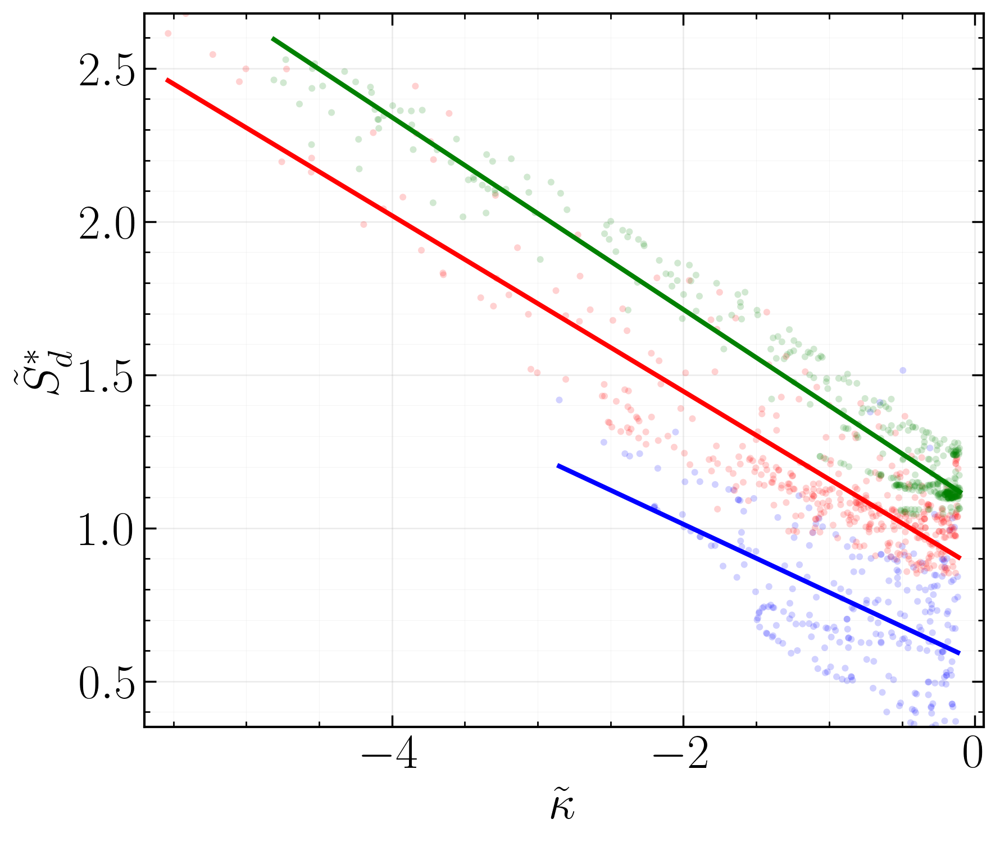

In [27]:
# Whole-domain negative-curvature clustering (DBSCAN), linear fits, beta grouping, and plots
from sklearn.cluster import DBSCAN, KMeans
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.metrics import mean_squared_error

DBSCAN_EPS = 0.1
DBSCAN_MIN_SAMPLES = 10
SAVE_WHOLE_DOMAIN_PLOTS = True
WHOLE_DOMAIN_OUT_DIR = "neg_cluster_whole_domain"
WHOLE_GROUP_LINE_WIDTH = 2.4
WHOLE_GROUP_POINT_ALPHA = 0.18
WHOLE_GROUP_POINT_S = 12
WHOLE_GROUP_COLORS = ["blue", "red", "green"]





WHOLE_DOMAIN_CLUSTERED = {}
whole_lin_rows = []
whole_point_map = {}

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        need_cols = ["x", "y", CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        neg_df = dfv[dfv[CURVATURE_COLUMN] <= CURVATURE_LOW].copy()
        if neg_df.empty:
            continue

        xy = neg_df[["x", "y"]].to_numpy()
        xy_scaled = StandardScaler().fit_transform(xy)
        labels = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES).fit_predict(xy_scaled)
        neg_df["cluster"] = labels

        # Store labels for all points (non-negative or noise remain -1)
        cluster_labels = pd.Series(-1, index=dfv.index, dtype=int)
        cluster_labels.loc[neg_df.index] = labels
        WHOLE_DOMAIN_CLUSTERED[(int(t), float(c_val))] = cluster_labels

        neg_df = neg_df[neg_df["cluster"] != -1].copy()

        for cluster_id in sorted(neg_df["cluster"].unique()):
            if cluster_id == -1:
                continue
            cluster_df = neg_df[neg_df["cluster"] == cluster_id].copy()
            if len(cluster_df) < 2:
                continue

            curv = cluster_df[CURVATURE_COLUMN].to_numpy().reshape(-1, 1)
            sd = cluster_df[TARGET_COLUMN].to_numpy()

            model = LinearRegression()
            model.fit(curv, sd)

            y_pred = model.predict(curv)
            alpha = float(model.coef_[0])
            beta = float(model.intercept_)
            rmse = float(np.sqrt(mean_squared_error(sd, y_pred)))

            whole_lin_rows.append({
                "time_step": int(t),
                "iso": float(c_val),
                "cluster": int(cluster_id),
                "alpha": alpha,
                "beta": beta,
                "RMSE": rmse,
                "n": int(len(cluster_df)),
            })

            whole_point_map[(int(t), float(c_val), int(cluster_id))] = (
                cluster_df[CURVATURE_COLUMN].to_numpy(),
                cluster_df[TARGET_COLUMN].to_numpy(),
            )

whole_lin_df = pd.DataFrame(whole_lin_rows)
if whole_lin_df.empty:
    print("No whole-domain negative-curvature cluster fits were found.")
else:
    print(whole_lin_df)

if whole_lin_df.empty:
    print("No whole-domain cluster fits available for beta grouping.")
else:
    for (t, c_val), df_tc in whole_lin_df.groupby(["time_step", "iso"]):
        df_tc = df_tc.copy()
        n_groups = min(3, len(df_tc))
        if n_groups < 1:
            continue

        betas = df_tc["beta"].to_numpy().reshape(-1, 1)
        if n_groups == 1:
            labels = np.zeros(len(df_tc), dtype=int)
        else:
            kmeans = KMeans(n_clusters=n_groups, n_init=10, random_state=0)
            labels = kmeans.fit_predict(betas)

        df_tc["beta_group"] = labels
        ordered_groups = (
            df_tc.groupby("beta_group")["beta"].mean().sort_values().index.to_list()
        )
        group_map = {g: i for i, g in enumerate(ordered_groups)}
        df_tc["beta_group"] = df_tc["beta_group"].map(group_map)

        if n_groups == 3:
            group_names = ["low beta", "mid beta", "high beta"]
        elif n_groups == 2:
            group_names = ["low beta", "high beta"]
        else:
            group_names = ["all beta"]

        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)

        for group_id in range(n_groups):
            group_rows = df_tc[df_tc["beta_group"] == group_id]
            if group_rows.empty:
                continue

            curv_list = []
            sd_list = []
            for _, row in group_rows.iterrows():
                key = (int(row["time_step"]), float(row["iso"]), int(row["cluster"]))
                curv, sd = whole_point_map.get(key, (np.array([]), np.array([])))
                if curv.size == 0:
                    continue
                curv_list.append(curv)
                sd_list.append(sd)

            if not curv_list:
                continue

            curv_all = np.concatenate(curv_list)
            sd_all = np.concatenate(sd_list)

            model = LinearRegression()
            model.fit(curv_all.reshape(-1, 1), sd_all)
            y_pred = model.predict(curv_all.reshape(-1, 1))

            mask_sc, _ = sd_joint_percentile_mask(sd_all, y_pred)
            if not np.any(mask_sc):
                continue
            curv_all = curv_all[mask_sc]
            sd_all = sd_all[mask_sc]
            y_pred = y_pred[mask_sc]

            order = np.argsort(curv_all)
            color = WHOLE_GROUP_COLORS[group_id % len(WHOLE_GROUP_COLORS)]
            label = group_names[group_id]

            ax.scatter(
                curv_all,
                sd_all,
                s=WHOLE_GROUP_POINT_S,
                alpha=WHOLE_GROUP_POINT_ALPHA,
                color=color,
                edgecolors="none",
                label=f"{label} data",
            )
            ax.plot(
                curv_all[order],
                y_pred[order],
                color=color,
                linewidth=WHOLE_GROUP_LINE_WIDTH,
                label=f"{label} fit",
            )

        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        ax.margins(x=0.03, y=0.03)
        style_axes(ax)
        apply_sd_ylim_negative(ax)

        if SAVE_WHOLE_DOMAIN_PLOTS:
            out_dir = case_out_dir(t, c_val, WHOLE_DOMAIN_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            base = out_dir / "beta_group_fits"
            fig.savefig(base.with_suffix(".png"), dpi=FIG_DPI)
            fig.savefig(base.with_suffix(".pdf"))
            fig.savefig(base.with_suffix(".svg"))

        plt.show()
        plt.close(fig)


[BLEND-GROUP] t=200, T=0.60: L_curv=3.404e-01, L_str=-2.543e-01 | R^2(all)=-0.221, RMSE(all)=3.015e-01


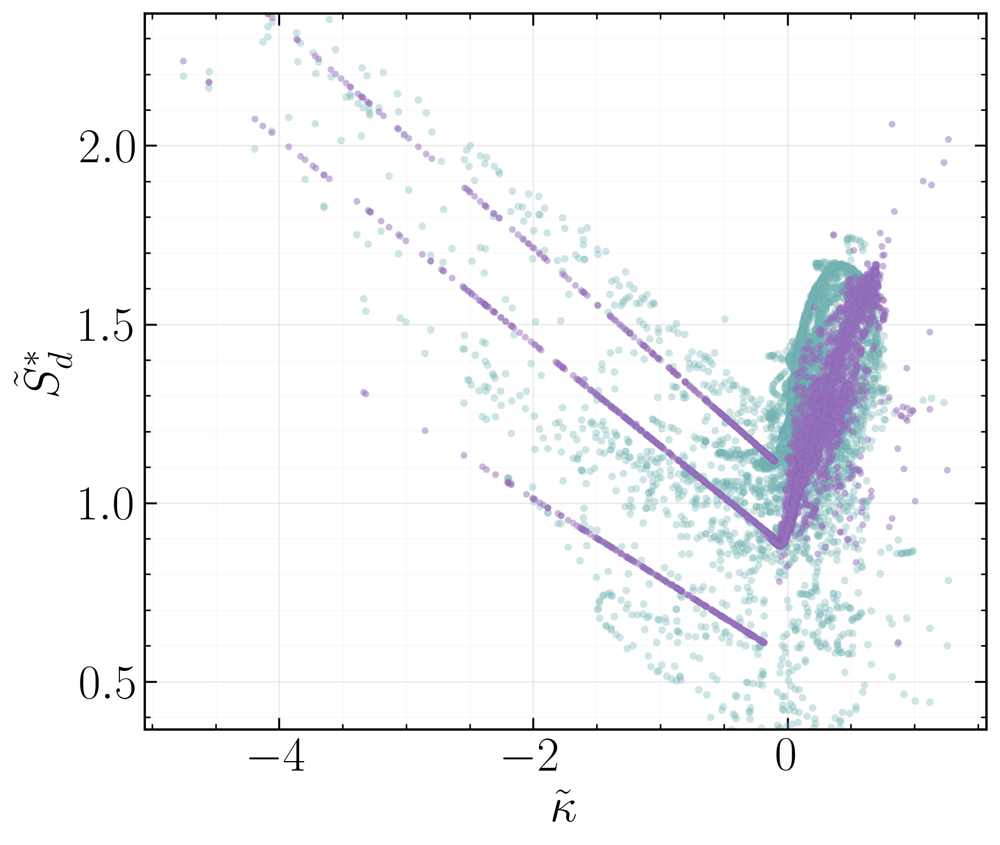

In [28]:
# Blended model with group-specific negative linear laws (reuse whole-domain DBSCAN groups)
from sklearn.cluster import KMeans
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

SAVE_BLEND_GROUP_PLOTS = True
BLEND_GROUP_OUT_DIR = "blend_group_linear"
BLEND_SCATTER_S = 14
BLEND_SCATTER_ALPHA = 0.35
BLEND_MAX_SCATTER_POINTS = 40000

if "whole_lin_df" not in globals() or "whole_point_map" not in globals() or "WHOLE_DOMAIN_CLUSTERED" not in globals():
    raise RuntimeError("Run the whole-domain DBSCAN clustering cell first to define whole_lin_df/whole_point_map/WHOLE_DOMAIN_CLUSTERED.")

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()

        refs = load_reference_quantities(case_t, float(c_val))
        s_l = float(refs["S_L"])
        l_ref = float(refs["L_ref"])

        need_cols = [
            "x", "y", CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN,
            TEMP_COLUMN, THERMAL_DIFF_COLUMN,
        ]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)
        dfv = scale_thermal_diffusivity(dfv)

        # --- Positive-curvature model (same as before) ---
        pos_df = dfv[dfv[CURVATURE_COLUMN] >= CURVATURE_HIGH].copy()
        pos_df = apply_outlier_filter(pos_df, [CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN])
        l_curv, l_str, _, _ = fit_markstein_lengths(pos_df, CURVATURE_COLUMN, STRETCH_COLUMN, TARGET_COLUMN)

        # --- Reuse clustering/grouping from whole_lin_df ---
        df_tc = whole_lin_df[(whole_lin_df["time_step"] == int(t)) & (whole_lin_df["iso"] == float(c_val))].copy()
        if df_tc.empty:
            continue

        # Recreate ordered beta groups
        n_groups = min(3, len(df_tc))
        betas = df_tc["beta"].to_numpy().reshape(-1, 1)
        if n_groups == 1:
            labels = np.zeros(len(df_tc), dtype=int)
        else:
            labels = KMeans(n_clusters=n_groups, n_init=10, random_state=0).fit_predict(betas)
        df_tc["beta_group"] = labels
        ordered_groups = (
            df_tc.groupby("beta_group")["beta"].mean().sort_values().index.to_list()
        )
        group_map = {g: i for i, g in enumerate(ordered_groups)}
        df_tc["beta_group"] = df_tc["beta_group"].map(group_map)

        # Fit a linear law for each group from the stored negative points
        group_models = {}
        cluster_to_group = dict(zip(df_tc["cluster"].astype(int), df_tc["beta_group"].astype(int)))
        for group_id in sorted(df_tc["beta_group"].unique()):
            group_rows = df_tc[df_tc["beta_group"] == group_id]
            curv_list = []
            sd_list = []
            for _, row in group_rows.iterrows():
                key = (int(row["time_step"]), float(row["iso"]), int(row["cluster"]))
                curv, sd = whole_point_map.get(key, (np.array([]), np.array([])))
                if curv.size == 0:
                    continue
                curv_list.append(curv)
                sd_list.append(sd)
            if not curv_list:
                continue
            curv_all = np.concatenate(curv_list)
            sd_all = np.concatenate(sd_list)
            model = LinearRegression()
            model.fit(curv_all.reshape(-1, 1), sd_all)
            group_models[int(group_id)] = (
                float(model.coef_[0]),
                float(model.intercept_),
            )

        if not group_models:
            continue

        # Fallback global negative model from stored points
        curv_all = np.concatenate([v[0] for (tt, cc, _), v in whole_point_map.items() if tt == int(t) and cc == float(c_val)])
        sd_all = np.concatenate([v[1] for (tt, cc, _), v in whole_point_map.items() if tt == int(t) and cc == float(c_val)])
        global_model = LinearRegression()
        global_model.fit(curv_all.reshape(-1, 1), sd_all)
        global_alpha = float(global_model.coef_[0])
        global_beta = float(global_model.intercept_)

        # Get stored cluster labels for this (t, iso)
        cluster_labels = WHOLE_DOMAIN_CLUSTERED.get((int(t), float(c_val)))
        if cluster_labels is None:
            continue
        # Align labels to current dfv by index
        cluster_labels = cluster_labels.reindex(dfv.index).fillna(-1).astype(int).to_numpy()

        # --- Predict on the full curvature range ---
        kappa = dfv[CURVATURE_COLUMN].to_numpy()
        K = dfv[STRETCH_COLUMN].to_numpy()
        y_true = dfv[TARGET_COLUMN].to_numpy()

        # Negative model: group-specific linear law, fallback to global if needed
        y_neg = np.empty_like(kappa, dtype=float)
        for i, (lab, kap) in enumerate(zip(cluster_labels, kappa)):
            g = cluster_to_group.get(int(lab), None)
            if g is not None and g in group_models:
                a, b = group_models[g]
            else:
                a, b = global_alpha, global_beta
            y_neg[i] = a * kap + b

        y_pos = 1.0 - (l_curv * kappa + l_str * K)

        w = smoothstep_weight(kappa, CURVATURE_LOW, CURVATURE_HIGH)
        y_blend = (1.0 - w) * y_neg + w * y_pos

        r2_all, rmse_all = r2_rmse(y_true, y_blend)
        print(
            f"[BLEND-GROUP] t={t}, T={float(c_val):.2f}: "
            f"L_curv={l_curv:.3e}, L_str={l_str:.3e} | "
            f"R^2(all)={r2_all:.3f}, RMSE(all)={rmse_all:.3e}"
        )

        if len(dfv) > BLEND_MAX_SCATTER_POINTS:
            df_sc = dfv.sample(BLEND_MAX_SCATTER_POINTS, random_state=0)
        else:
            df_sc = dfv

        k_sc = df_sc[CURVATURE_COLUMN].to_numpy()
        y_sc = df_sc[TARGET_COLUMN].to_numpy()

        K_sc = df_sc[STRETCH_COLUMN].to_numpy()
        labs_sc = cluster_labels[:len(df_sc)]
        y_neg_sc = np.empty_like(k_sc, dtype=float)
        for i, (lab, kap) in enumerate(zip(labs_sc, k_sc)):
            g = cluster_to_group.get(int(lab), None)
            if g is not None and g in group_models:
                a, b = group_models[g]
            else:
                a, b = global_alpha, global_beta
            y_neg_sc[i] = a * kap + b
        y_pos_sc = 1.0 - (l_curv * k_sc + l_str * K_sc)
        w_sc = smoothstep_weight(k_sc, CURVATURE_LOW, CURVATURE_HIGH)
        y_blend_sc = (1.0 - w_sc) * y_neg_sc + w_sc * y_pos_sc
        mask_sc, sd_bounds = sd_joint_percentile_mask(y_sc, y_blend_sc)
        if sd_bounds is None:
            print(f"[BLEND-GROUP] t={t}, T={float(c_val):.2f}: skipped (no points in joint Sd percentile range)")
            continue
        k_sc = k_sc[mask_sc]
        y_sc = y_sc[mask_sc]
        y_blend_sc = y_blend_sc[mask_sc]

        fig, ax = plt.subplots(figsize=FIG_SIZE, dpi=FIG_DPI, constrained_layout=False)
        style_axes(ax)

        ax.scatter(
            k_sc, y_sc,
            s=BLEND_SCATTER_S, alpha=BLEND_SCATTER_ALPHA,
            facecolor=COLOR_DATA, edgecolor=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH, label="Data"
        )
        ax.scatter(
            k_sc, y_blend_sc,
            s=BLEND_SCATTER_S * 0.8, alpha=min(0.8, BLEND_SCATTER_ALPHA + 0.15),
            facecolor=COLOR_PRED, edgecolor=COLOR_PRED_EDGE,
            linewidths=SCATTER_LINEWIDTH, label="Blended (group neg)"
        )

        ax.set_xlabel(LABEL_CURV)
        ax.set_ylabel(LABEL_SD)
        ax.set_ylim(*sd_bounds)

        if SAVE_BLEND_GROUP_PLOTS:
            out_dir = case_out_dir(t, float(c_val), BLEND_GROUP_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            base = out_dir / "sd_vs_curvature_blended_group"
            save_multi_fig(fig, base, "blend_group")

        plt.show()


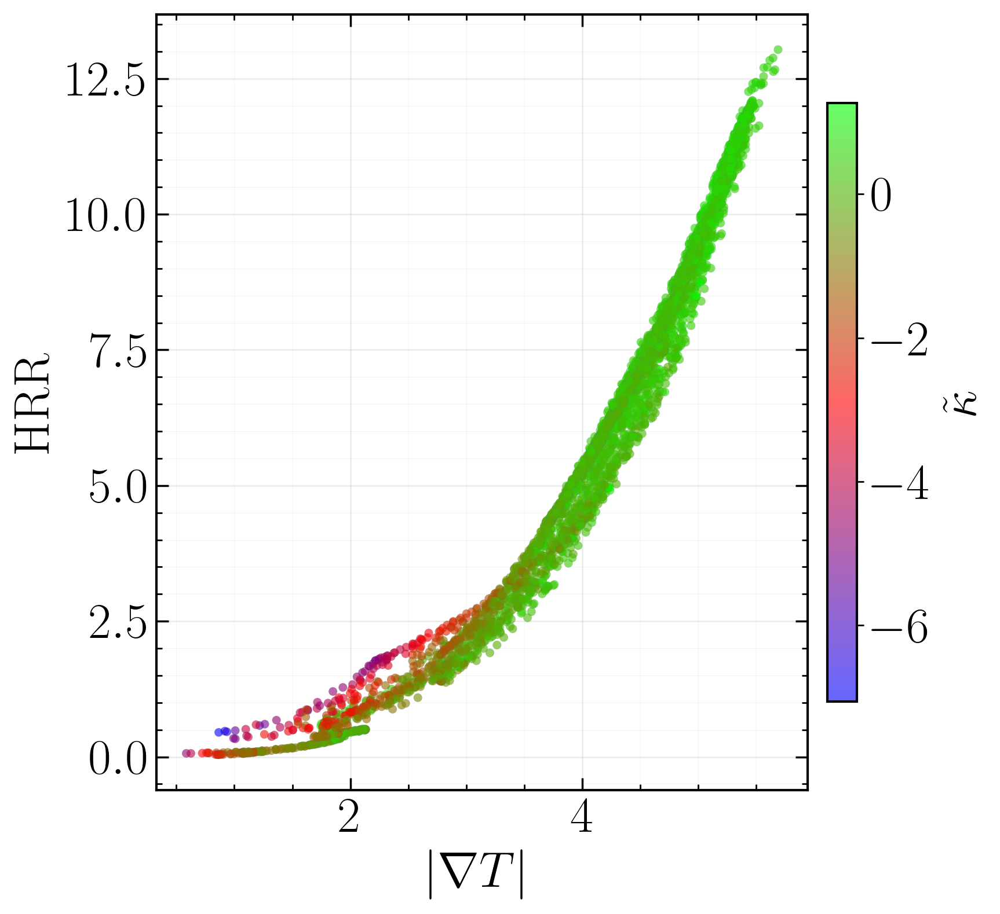

In [29]:
# gradT vs HRR using the notebook plot style
GRADT_COLUMN = str(CFG.get("GRADT_COLUMN", "gradT"))
HRR_COLUMN = str(CFG.get("HRR_COLUMN", "HRR"))

LABEL_GRADT = r"$\lvert \nabla T \rvert$"
LABEL_HRR = r"$\text{HRR}$"

SAVE_GRADT_HRR_PLOTS = True
GRADT_HRR_OUT_DIR = "gradT_hrr_plots"
GRADT_HRR_SCATTER_S = 18
GRADT_HRR_ALPHA = 0.6
GRADT_HRR_CMAP = str(CFG.get("GRADT_HRR_CMAP", COLORMAP))
GRADT_HRR_FIG_SIZE_RAW = CFG.get("GRADT_HRR_FIG_SIZE", (6.8, 6.2))
if isinstance(GRADT_HRR_FIG_SIZE_RAW, (list, tuple)) and len(GRADT_HRR_FIG_SIZE_RAW) == 2:
    GRADT_HRR_FIG_SIZE = (float(GRADT_HRR_FIG_SIZE_RAW[0]), float(GRADT_HRR_FIG_SIZE_RAW[1]))
else:
    GRADT_HRR_FIG_SIZE = (6.8, 6.2)
GRADT_HRR_CBAR_FRACTION = float(CFG.get("GRADT_HRR_CBAR_FRACTION", 0.046))
GRADT_HRR_CBAR_PAD = float(CFG.get("GRADT_HRR_CBAR_PAD", 0.03))

for t in TIME_STEPS:
    case_t = make_case(time_step=t)
    fronts_t = load_fronts(case_t, PROGRESS_LEVELS)

    for c_val, front in fronts_t.items():
        front = front.copy()
        need_cols = [GRADT_COLUMN, HRR_COLUMN, CURVATURE_COLUMN]
        require_columns(front, need_cols, context=f"t={t}, ISO {c_val}:")
        dfv = clean_valid_rows(front, need_cols)

        fig, ax = plt.subplots(figsize=GRADT_HRR_FIG_SIZE, dpi=FIG_DPI, constrained_layout=True)
        sc = ax.scatter(
            dfv[GRADT_COLUMN],
            dfv[HRR_COLUMN],
            c=dfv[CURVATURE_COLUMN],
            cmap=GRADT_HRR_CMAP,
            s=GRADT_HRR_SCATTER_S,
            alpha=GRADT_HRR_ALPHA,
            edgecolors=COLOR_DATA_EDGE,
            linewidths=SCATTER_LINEWIDTH,
            zorder=3,
        )
        cbar = fig.colorbar(sc, ax=ax, fraction=GRADT_HRR_CBAR_FRACTION, pad=GRADT_HRR_CBAR_PAD)
        cbar.set_label(LABEL_CURV)

        ax.set_xlabel(LABEL_GRADT)
        ax.set_ylabel(LABEL_HRR)
        style_axes(ax)

        if SAVE_GRADT_HRR_PLOTS:
            out_dir = case_out_dir(t, c_val, GRADT_HRR_OUT_DIR)
            out_dir.mkdir(parents=True, exist_ok=True)
            savepath = out_dir / "gradT_vs_HRR"
            save_multi_fig(fig, savepath, "all_data")

        plt.show()
        plt.close(fig)
